In [1]:
# 1. 모듈 불러오기
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import pandas as pd
import numpy as np

In [2]:
# 2. 데이터 불러오기
led = pd.read_csv('./datas/dataset_led.csv')
led

,Unnamed: 0,Country,Year,Status,Lifeexpectancy,AdultMortality,infantdeaths,Alcohol,percentageexpenditure,HepatitisB,...,GDP,Population,thinness1-19years,thinness5-9years,Incomecompositionofresources,Schooling,section_low,section_low_mid,section_high_mid,section_high
0,0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,...,584.061200,33736494.0,17.2,17.3,0.479,10.1,0,1,0,0
1,1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,...,612.696514,327582.0,17.5,17.5,0.476,10.0,0,1,0,0
2,2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,...,631.744976,31731688.0,17.7,17.7,0.470,9.9,0,1,0,0
3,3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,...,669.959000,3696958.0,17.9,18.0,0.463,9.8,0,1,0,0
4,4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,...,63.537231,2978599.0,18.2,18.2,0.454,9.5,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,...,454.366654,12777511.0,9.4,9.4,0.407,9.2,1,0,0,0
2934,2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,...,453.351155,12633897.0,9.8,9.9,0.418,9.5,1,0,0,0
2935,2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,...,57.348340,125525.0,1.2,1.3,0.427,10.0,1,0,0,0
2936,2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,...,548.587312,12366165.0,1.6,1.7,0.427,9.8,0,1,0,0


In [3]:
# 3. Country 나라 갯수 - 많음...
len(led["Country"].unique())

193

In [4]:
# 4. GDP에 대해 알아보자
led['GDP'].describe()

count      2938.000000
mean       7946.740562
std       14654.061956
min           1.040000
25%         519.839630
50%        2009.395612
75%        6831.020771
max      189464.583600
Name: GDP, dtype: float64

In [5]:
# 5. GDP를 더미화 후 컬럼 을 4개로 나누기, stirng 타입의 GDP 만들기 
led['GDP_Bins']=pd.cut(led.GDP,bins = [1.040000,519.839630,2009.395612,6831.020771,189464.583600], labels=['low','low_mid','high_mid','high'])
led.head(50)

,Unnamed: 0,Country,Year,Status,Lifeexpectancy,AdultMortality,infantdeaths,Alcohol,percentageexpenditure,HepatitisB,...,Population,thinness1-19years,thinness5-9years,Incomecompositionofresources,Schooling,section_low,section_low_mid,section_high_mid,section_high,GDP_Bins
0,0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,...,33736494.0,17.2,17.3,0.479,10.1,0,1,0,0,low_mid
1,1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,...,327582.0,17.5,17.5,0.476,10.0,0,1,0,0,low_mid
2,2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,...,31731688.0,17.7,17.7,0.470,9.9,0,1,0,0,low_mid
3,3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,...,3696958.0,17.9,18.0,0.463,9.8,0,1,0,0,low_mid
4,4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,...,2978599.0,18.2,18.2,0.454,9.5,1,0,0,0,low
5,5,Afghanistan,2010,Developing,58.8,279.0,74,0.01,79.679367,66.0,...,2883167.0,18.4,18.4,0.448,9.2,0,1,0,0,low_mid
6,6,Afghanistan,2009,Developing,58.6,281.0,77,0.01,56.762217,63.0,...,284331.0,18.6,18.7,0.434,8.9,1,0,0,0,low
7,7,Afghanistan,2008,Developing,58.1,287.0,80,0.03,25.873925,64.0,...,2729431.0,18.8,18.9,0.433,8.7,1,0,0,0,low
8,8,Afghanistan,2007,Developing,57.5,295.0,82,0.02,10.910156,63.0,...,26616792.0,19.0,19.1,0.415,8.4,1,0,0,0,low
9,9,Afghanistan,2006,Developing,57.3,295.0,84,0.03,17.171518,64.0,...,2589345.0,19.2,19.3,0.405,8.1,1,0,0,0,low


<AxesSubplot:>

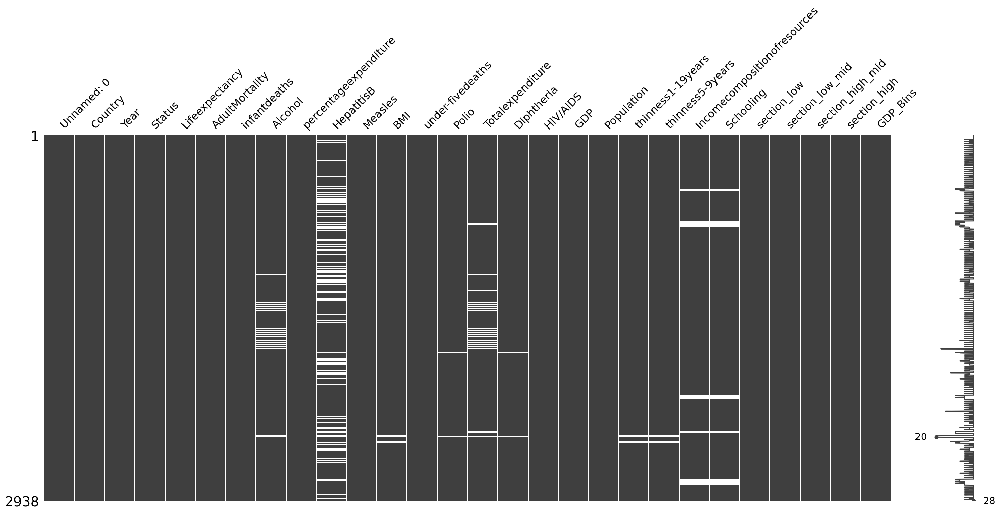

In [6]:
# 6. 결측값 보기
msno.matrix(led)

In [7]:
led.isnull().sum()

Unnamed: 0                        0
Country                           0
Year                              0
Status                            0
Lifeexpectancy                   10
AdultMortality                   10
infantdeaths                      0
Alcohol                         194
percentageexpenditure             0
HepatitisB                      553
Measles                           0
BMI                              34
under-fivedeaths                  0
Polio                            19
Totalexpenditure                226
Diphtheria                       19
HIV/AIDS                          0
GDP                               0
Population                        0
thinness1-19years                34
thinness5-9years                 34
Incomecompositionofresources    167
Schooling                       163
section_low                       0
section_low_mid                   0
section_high_mid                  0
section_high                      0
GDP_Bins                    

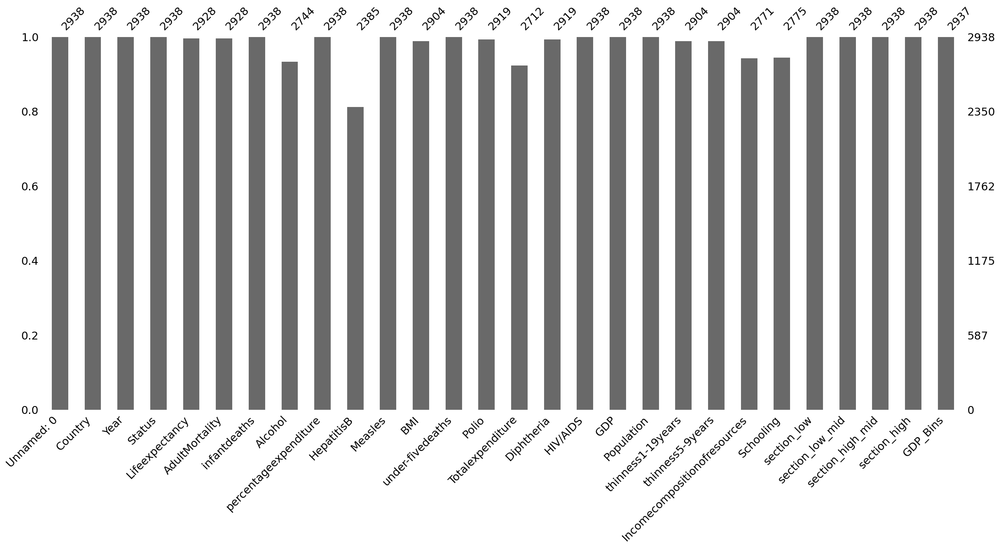

In [8]:
# 10% 미만 : 제거 또는 치환, 10-20%미만 : 모델 기반 처리
import missingno as msno
msno.bar(led)
plt.show();

In [9]:
led.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Unnamed: 0                    2938 non-null   int64   
 1   Country                       2938 non-null   object  
 2   Year                          2938 non-null   int64   
 3   Status                        2938 non-null   object  
 4   Lifeexpectancy                2928 non-null   float64 
 5   AdultMortality                2928 non-null   float64 
 6   infantdeaths                  2938 non-null   int64   
 7   Alcohol                       2744 non-null   float64 
 8   percentageexpenditure         2938 non-null   float64 
 9   HepatitisB                    2385 non-null   float64 
 10  Measles                       2938 non-null   int64   
 11  BMI                           2904 non-null   float64 
 12  under-fivedeaths              2938 non-null   in

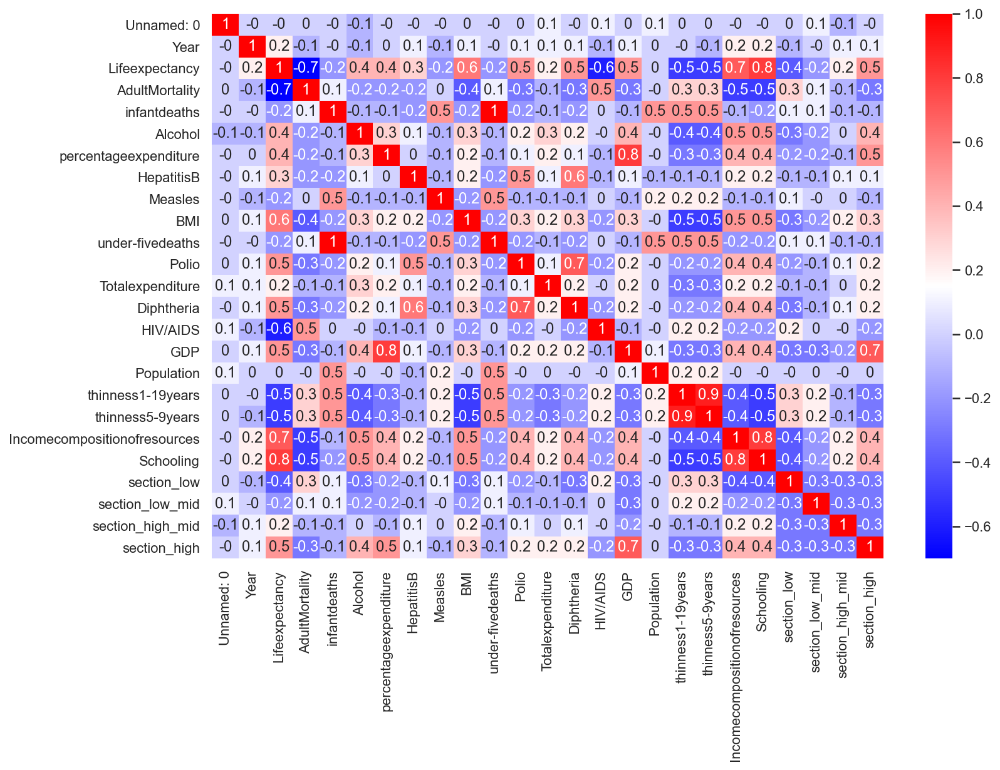

In [10]:
corr = led.corr()
corr["Lifeexpectancy"].sort_values(ascending=False)
# led.drop("Unnamed: 0",inplace=True,axis=1)
correlation_matrix = corr.round(1)
sns.set(rc={'figure.figsize':(12,8)})
sns.heatmap(correlation_matrix, annot =True,cmap="bwr")
plt.show()

Text(0.5, 1.0, 'Correlation with Missing Values')

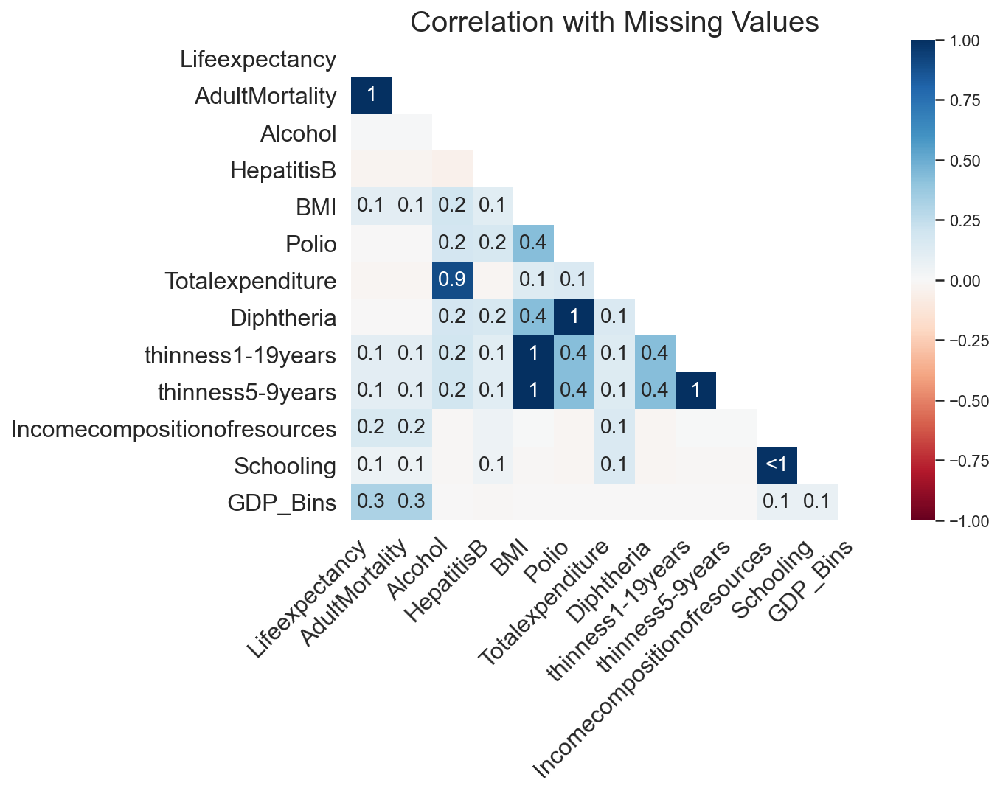

In [11]:
# 6-1 결측값의 상관관계 확인
import missingno as msno
missingdata_df = led.columns[led.isnull().any()].tolist()
msno.heatmap(led[missingdata_df], figsize=(8,6))
plt.title("Correlation with Missing Values", fontsize = 20)

In [12]:
# 7. 간염 B형의 결측값은 0 또는 중위수로 변환 -> 호주 접종률 94.6% -> 중위수로 결정
led[led['HepatitisB'].isnull()]["Country"].unique()

array(['Algeria', 'Angola', 'AntiguaandBarbuda', 'Argentina', 'Australia',
       'Azerbaijan', 'Bahamas', 'Bangladesh', 'Barbados', 'Benin',
       'BosniaandHerzegovina', 'BurkinaFaso', 'Burundi', "Côted'Ivoire",
       'CaboVerde', 'Cambodia', 'Cameroon', 'Canada',
       'CentralAfricanRepublic', 'Chad', 'Chile', 'Comoros', 'Congo',
       'Croatia', 'Czechia', "DemocraticPeople'sRepublicofKorea",
       'DemocraticRepublicoftheCongo', 'Denmark', 'Djibouti',
       'EquatorialGuinea', 'Eritrea', 'Estonia', 'Ethiopia', 'Finland',
       'Gabon', 'Ghana', 'Grenada', 'Guatemala', 'Guinea',
       'Guinea-Bissau', 'Guyana', 'Haiti', 'Hungary', 'Iceland', 'India',
       'Ireland', 'Jamaica', 'Japan', 'Kenya',
       "LaoPeople'sDemocraticRepublic", 'Lesotho', 'Liberia',
       'Madagascar', 'Malawi', 'Mali', 'Malta', 'Mauritania',
       'Montenegro', 'Mozambique', 'Myanmar', 'Namibia', 'Nepal',
       'Netherlands', 'Niger', 'Nigeria', 'Norway', 'Pakistan', 'Panama',
       'Paraguay'

In [13]:
# 8. 데이터 확인
led.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Unnamed: 0                    2938 non-null   int64   
 1   Country                       2938 non-null   object  
 2   Year                          2938 non-null   int64   
 3   Status                        2938 non-null   object  
 4   Lifeexpectancy                2928 non-null   float64 
 5   AdultMortality                2928 non-null   float64 
 6   infantdeaths                  2938 non-null   int64   
 7   Alcohol                       2744 non-null   float64 
 8   percentageexpenditure         2938 non-null   float64 
 9   HepatitisB                    2385 non-null   float64 
 10  Measles                       2938 non-null   int64   
 11  BMI                           2904 non-null   float64 
 12  under-fivedeaths              2938 non-null   in

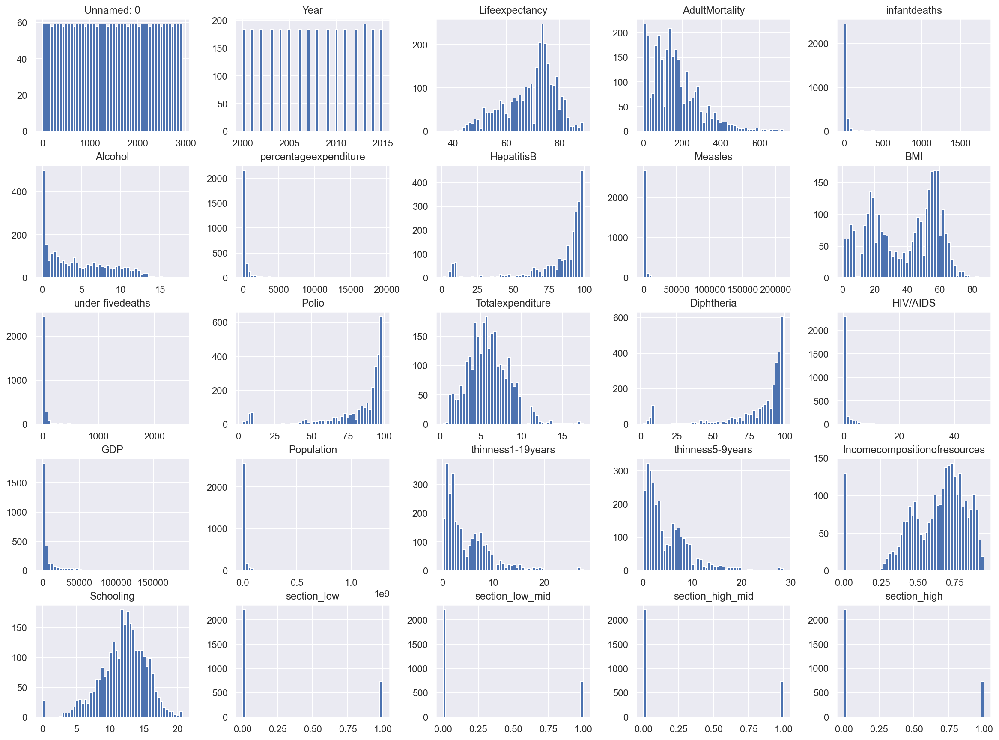

In [14]:
# 9. Schooling, TotalExpenditure을 제외한 컬럼은 모두 편향된 데이터이므로 중위수로 결정
# Schooling, TotalExpenditure 은 평균
led.hist(bins=50, figsize=(20,15))
plt.show()

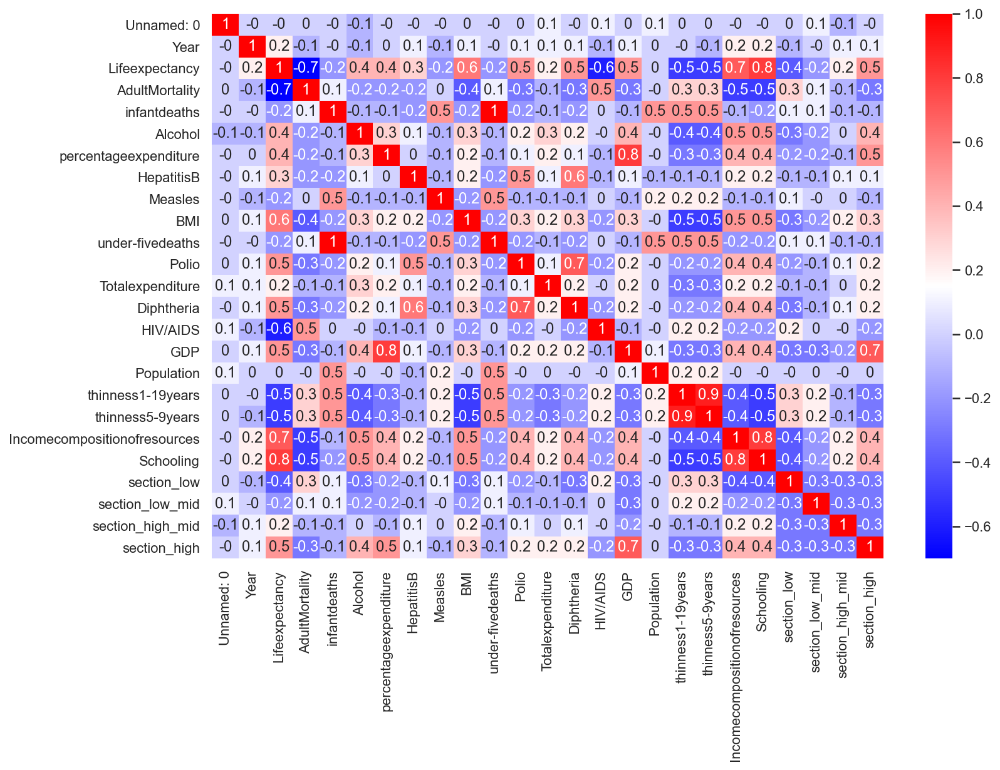

In [15]:
corr = led.corr()
corr["Lifeexpectancy"].sort_values(ascending=False)

correlation_matrix = corr.round(1)
sns.set(rc={'figure.figsize':(12,8)})
sns.heatmap(correlation_matrix, annot =True,cmap="bwr")
plt.show()

In [16]:
# 10. 결측값 채우기
led["Schooling"].fillna(led["Schooling"].mean(), inplace=True)
led["Totalexpenditure"].fillna(led["Totalexpenditure"].mean(), inplace=True)
led["Lifeexpectancy"].fillna(led["Lifeexpectancy"].median(), inplace=True)
led["AdultMortality"].fillna(led["AdultMortality"].median(), inplace=True)
led["Alcohol"].fillna(led["Alcohol"].median(), inplace=True)
led["HepatitisB"].fillna(led["HepatitisB"].median(), inplace=True)
led["BMI"].fillna(led["BMI"].median(), inplace=True)
led["Polio"].fillna(led["Polio"].median(), inplace=True)
led["Diphtheria"].fillna(led["Diphtheria"].median(), inplace=True)
led["thinness1-19years"].fillna(led["thinness1-19years"].median(), inplace=True)
led["thinness5-9years"].fillna(led["thinness5-9years"].median(), inplace=True)
led["Incomecompositionofresources"].fillna(led["Incomecompositionofresources"].median(), inplace=True)
led

,Unnamed: 0,Country,Year,Status,Lifeexpectancy,AdultMortality,infantdeaths,Alcohol,percentageexpenditure,HepatitisB,...,Population,thinness1-19years,thinness5-9years,Incomecompositionofresources,Schooling,section_low,section_low_mid,section_high_mid,section_high,GDP_Bins
0,0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,...,33736494.0,17.2,17.3,0.479,10.1,0,1,0,0,low_mid
1,1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,...,327582.0,17.5,17.5,0.476,10.0,0,1,0,0,low_mid
2,2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,...,31731688.0,17.7,17.7,0.470,9.9,0,1,0,0,low_mid
3,3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,...,3696958.0,17.9,18.0,0.463,9.8,0,1,0,0,low_mid
4,4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,...,2978599.0,18.2,18.2,0.454,9.5,1,0,0,0,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,...,12777511.0,9.4,9.4,0.407,9.2,1,0,0,0,low
2934,2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,...,12633897.0,9.8,9.9,0.418,9.5,1,0,0,0,low
2935,2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,...,125525.0,1.2,1.3,0.427,10.0,1,0,0,0,low
2936,2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,...,12366165.0,1.6,1.7,0.427,9.8,0,1,0,0,low_mid


<AxesSubplot:>

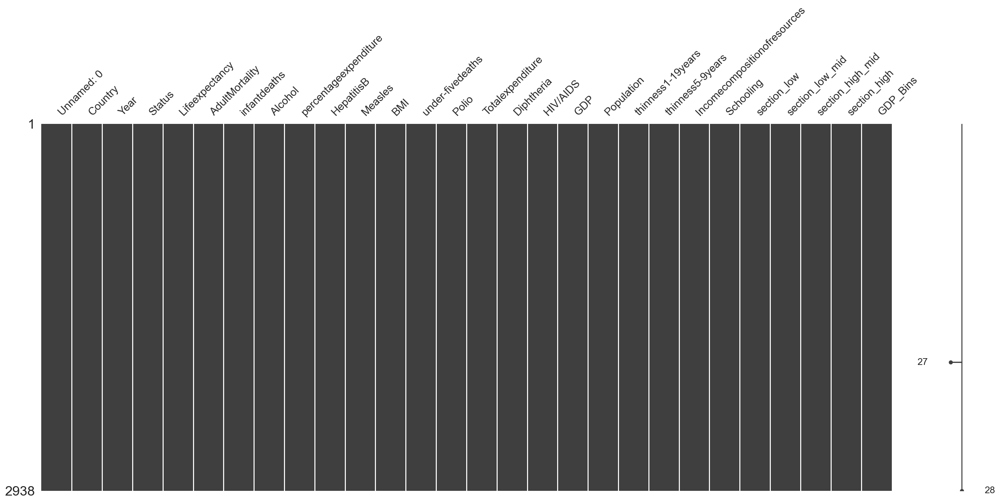

In [17]:
# 11. 결측값 확인
msno.matrix(led)

In [18]:
# 13. 데이터 전처리 완료 -> 파일 저장
led.to_csv("lifeexpectancy.csv",encoding="utf-8")

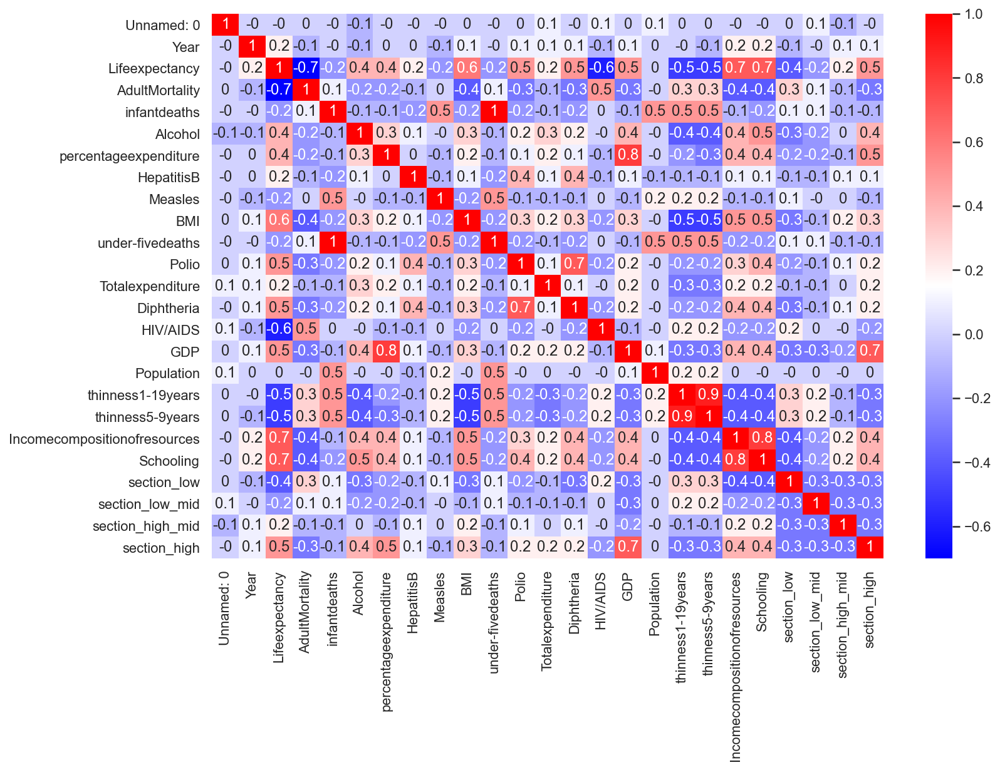

In [19]:
# 14. 데이터 간의 상관성 확인
corr = led.corr()
corr["Lifeexpectancy"].sort_values(ascending=False)

correlation_matrix = corr.round(1)
sns.set(rc={'figure.figsize':(12,8)})
sns.heatmap(correlation_matrix, annot =True,cmap="bwr")
plt.show()

In [20]:
print(corr["Lifeexpectancy"].sort_values(ascending=False))

Lifeexpectancy                  1.000000
Schooling                       0.714358
Incomecompositionofresources    0.688662
BMI                             0.556901
Diphtheria                      0.472211
section_high                    0.458823
Polio                           0.458399
GDP                             0.457657
Alcohol                         0.388918
percentageexpenditure           0.381418
Totalexpenditure                0.208879
section_high_mid                0.172504
Year                            0.170819
HepatitisB                      0.170219
Population                      0.006218
Unnamed: 0                     -0.015104
Measles                        -0.157767
section_low_mid                -0.196275
infantdeaths                   -0.196769
under-fivedeaths               -0.222738
section_low                    -0.435496
thinness5-9years               -0.462473
thinness1-19years              -0.468002
HIV/AIDS                       -0.556703
AdultMortality  

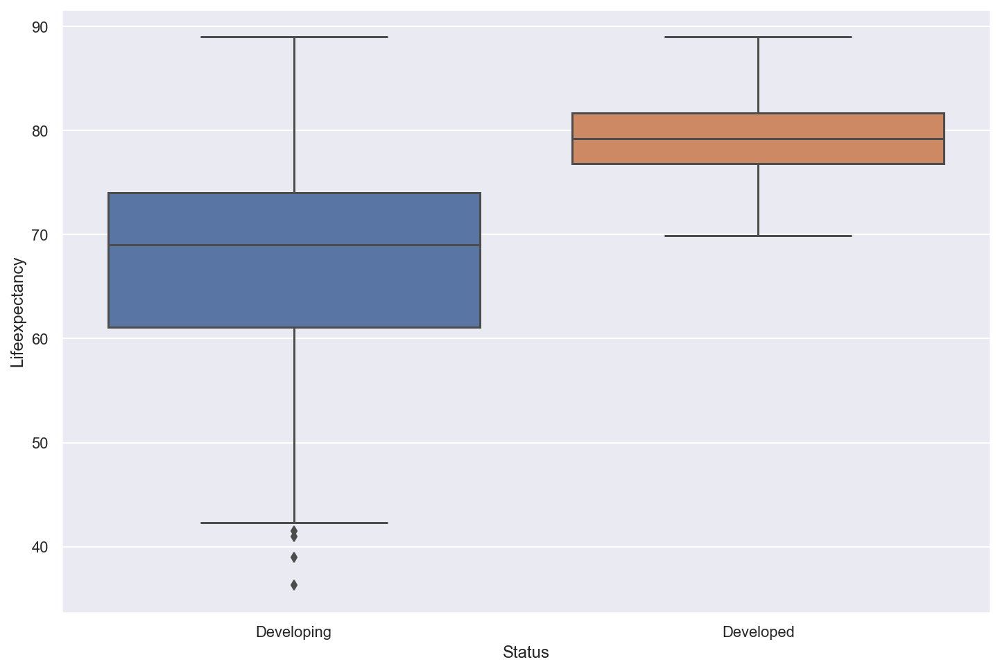

In [21]:
# 15. 개발도상국, 선진국에 따른 기대수명 - 선진국의 기대수명이 현저히 높다.
plt.figure(figsize=(12,8))
sns.boxplot(x='Status',y='Lifeexpectancy',data=led);

In [22]:
led.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Unnamed: 0                    2938 non-null   int64   
 1   Country                       2938 non-null   object  
 2   Year                          2938 non-null   int64   
 3   Status                        2938 non-null   object  
 4   Lifeexpectancy                2938 non-null   float64 
 5   AdultMortality                2938 non-null   float64 
 6   infantdeaths                  2938 non-null   int64   
 7   Alcohol                       2938 non-null   float64 
 8   percentageexpenditure         2938 non-null   float64 
 9   HepatitisB                    2938 non-null   float64 
 10  Measles                       2938 non-null   int64   
 11  BMI                           2938 non-null   float64 
 12  under-fivedeaths              2938 non-null   in

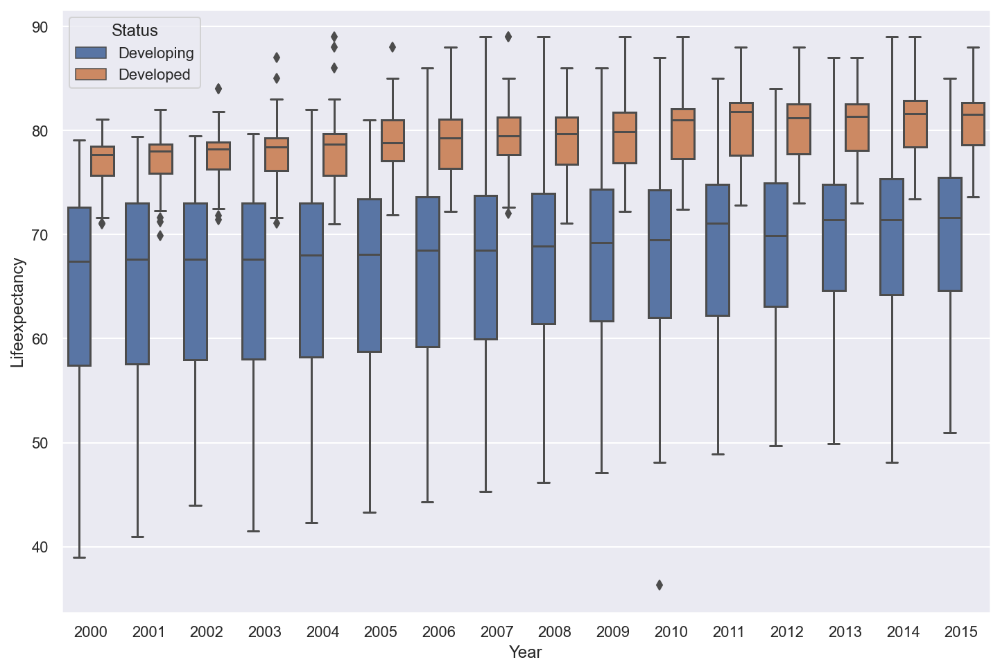

In [23]:
# 16. 연도별로 개발도상국, 선진국에 따른 기대수명 - 연도별로 조금씩 상승하나 현저한 차이 없음.
plt.figure(figsize=(12,8))
sns.boxplot(x='Year',y='Lifeexpectancy',hue='Status',data=led);

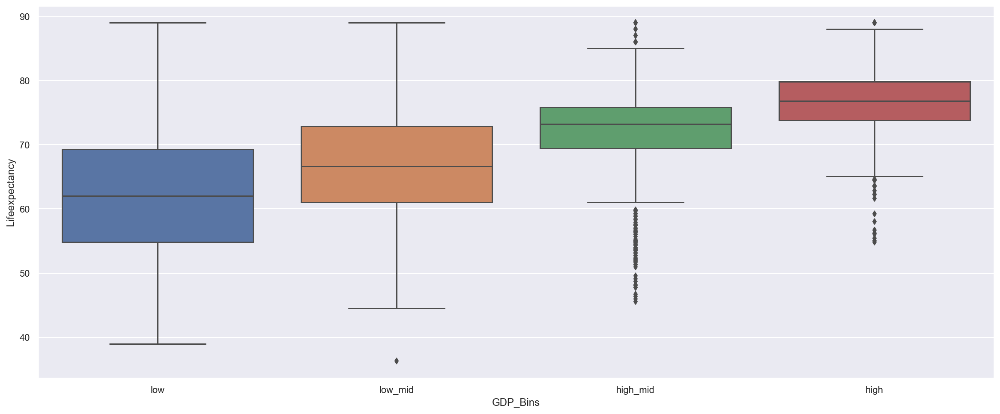

In [24]:
# 17. GDP 분류에 따른 기대수명 - GDP가 높을수록 기대수명 증가
plt.figure(figsize=(20,8))
sns.boxplot(x='GDP_Bins',y='Lifeexpectancy',data=led);

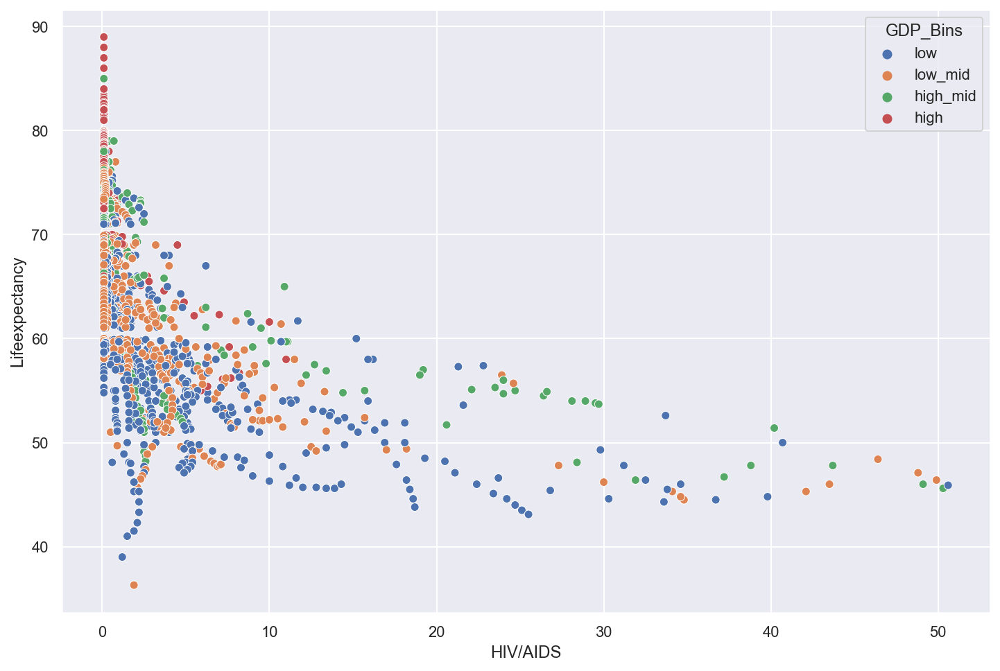

In [25]:
# HIV 와 기대수명은 음의 상관관계
plt.figure(figsize=(12,8))
sns.scatterplot(x='HIV/AIDS',y='Lifeexpectancy',hue = "GDP_Bins",data=led);

Text(0.5, 0.98, 'HIV/AIDS')

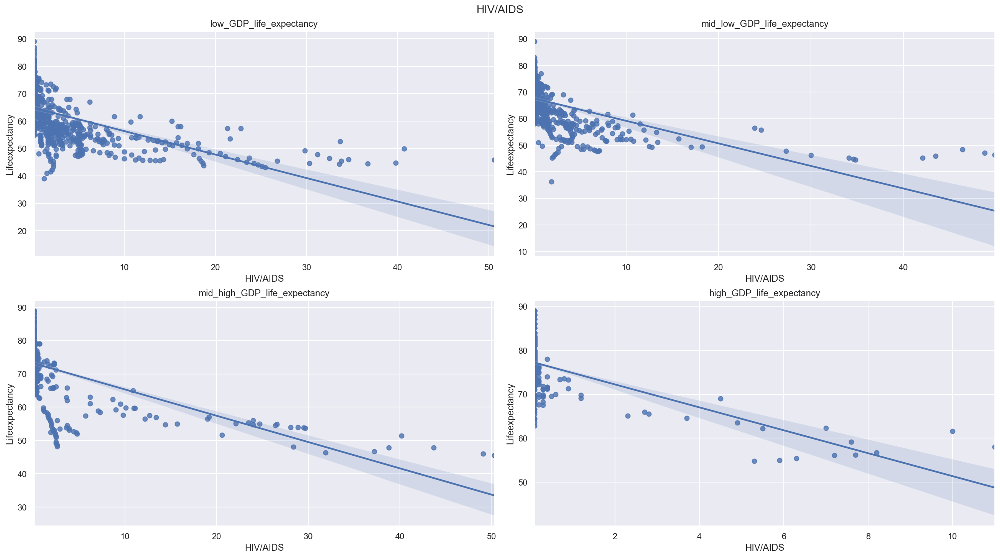

In [26]:
raw_1 = led[led["GDP_Bins"]=="low"]
raw_2 = led[led["GDP_Bins"]=="low_mid"]
raw_3 = led[led["GDP_Bins"]=="high_mid"]
raw_4 = led[led["GDP_Bins"]=="high"]

figure, ((ax1,ax2), (ax3,ax4)) = plt.subplots(nrows=2, ncols=2,constrained_layout=True)
figure.set_size_inches(18,10)

sns.regplot(data=raw_1, x="HIV/AIDS", y="Lifeexpectancy", ax=ax1)
sns.regplot(data=raw_2, x="HIV/AIDS", y="Lifeexpectancy", ax=ax2)
sns.regplot(data=raw_3, x="HIV/AIDS", y="Lifeexpectancy", ax=ax3)
sns.regplot(data=raw_4, x="HIV/AIDS", y="Lifeexpectancy", ax=ax4)

ax1.set(title="low_GDP_life_expectancy")
ax2.set(title="mid_low_GDP_life_expectancy")
ax3.set(title="mid_high_GDP_life_expectancy")
ax4.set(title="high_GDP_life_expectancy")
plt.suptitle('HIV/AIDS')

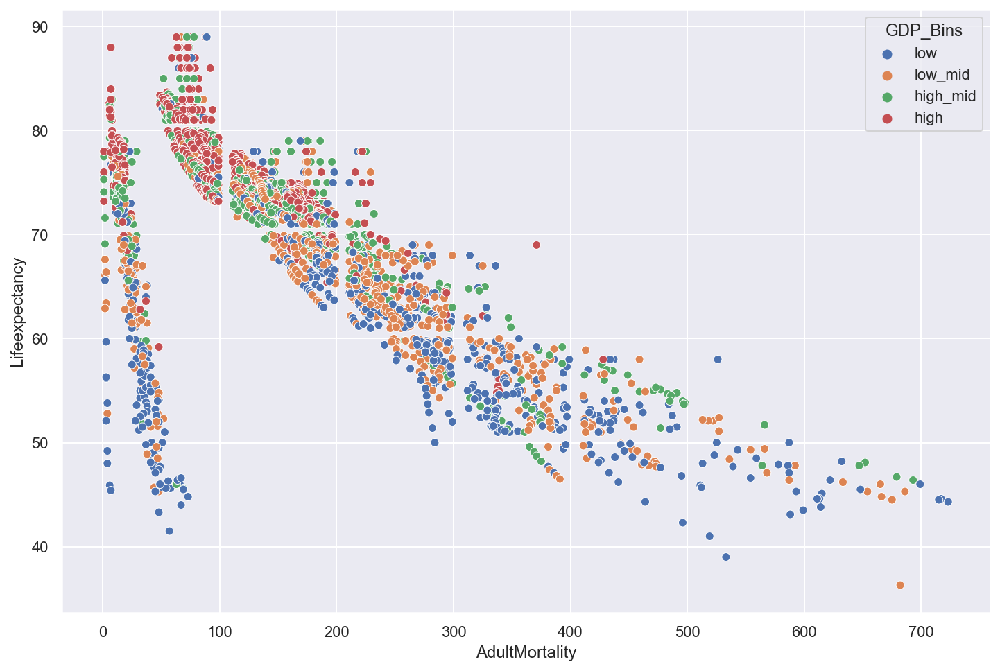

In [27]:
# 18. 남녀 성인 사망률과 기대수명은 음의 상관관계
plt.figure(figsize=(12,8))
sns.scatterplot(x='AdultMortality',y='Lifeexpectancy',hue = "GDP_Bins",data=led);

Text(0.5, 0.98, 'AdultMortality')

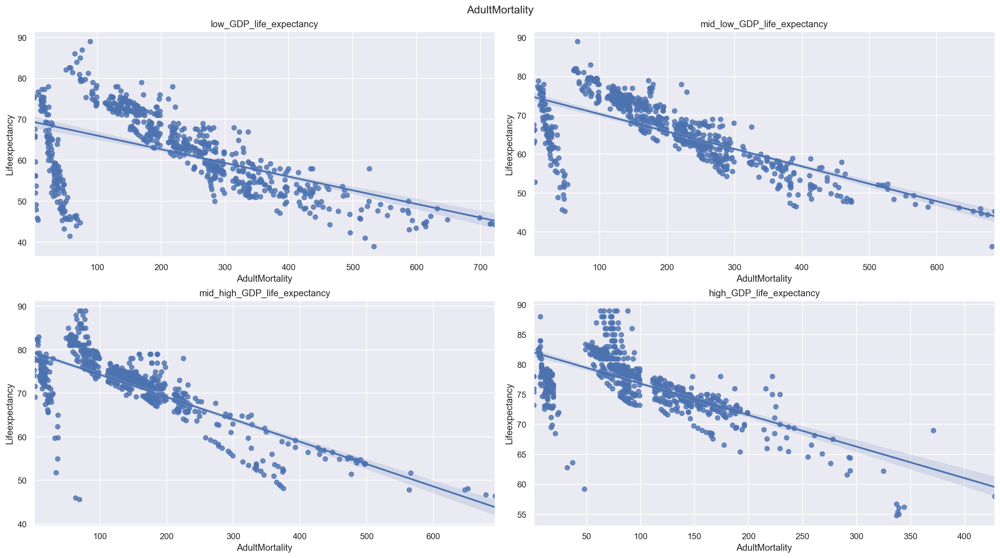

In [28]:
# 19. GDP별로 나누어서 성인 사망률과 기대수명 확인
raw_1 = led[led["GDP_Bins"]=="low"]
raw_2 = led[led["GDP_Bins"]=="low_mid"]
raw_3 = led[led["GDP_Bins"]=="high_mid"]
raw_4 = led[led["GDP_Bins"]=="high"]

figure, ((ax1,ax2), (ax3,ax4)) = plt.subplots(nrows=2, ncols=2,constrained_layout=True)
figure.set_size_inches(18,10)

sns.regplot(data=raw_1, x="AdultMortality", y="Lifeexpectancy", ax=ax1)
sns.regplot(data=raw_2, x="AdultMortality", y="Lifeexpectancy", ax=ax2)
sns.regplot(data=raw_3, x="AdultMortality", y="Lifeexpectancy", ax=ax3)
sns.regplot(data=raw_4, x="AdultMortality", y="Lifeexpectancy", ax=ax4)

ax1.set(title="low_GDP_life_expectancy")
ax2.set(title="mid_low_GDP_life_expectancy")
ax3.set(title="mid_high_GDP_life_expectancy")
ax4.set(title="high_GDP_life_expectancy")
plt.suptitle('AdultMortality')

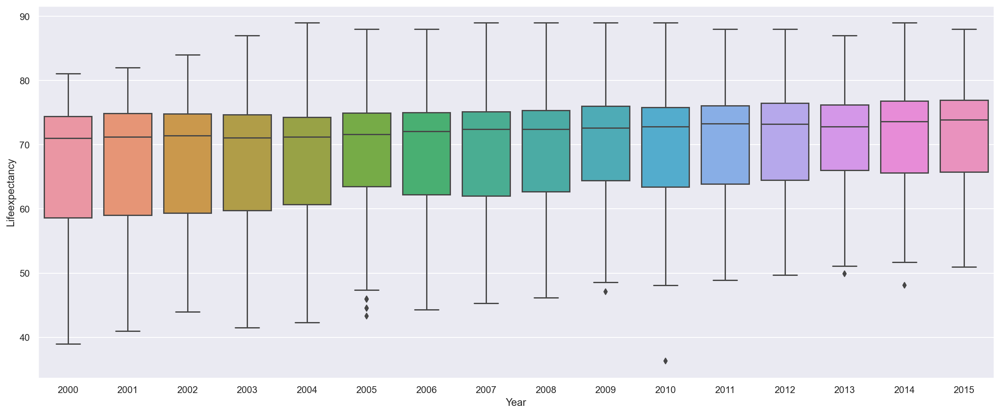

In [29]:
# 20. 연도에 따른 기대수명 차이 - 차이가 없음 
plt.figure(figsize=(20,8))
sns.boxplot(x='Year',y='Lifeexpectancy',data=led);

[Text(0.5, 1.0, 'high_GDP_life_expectancy')]

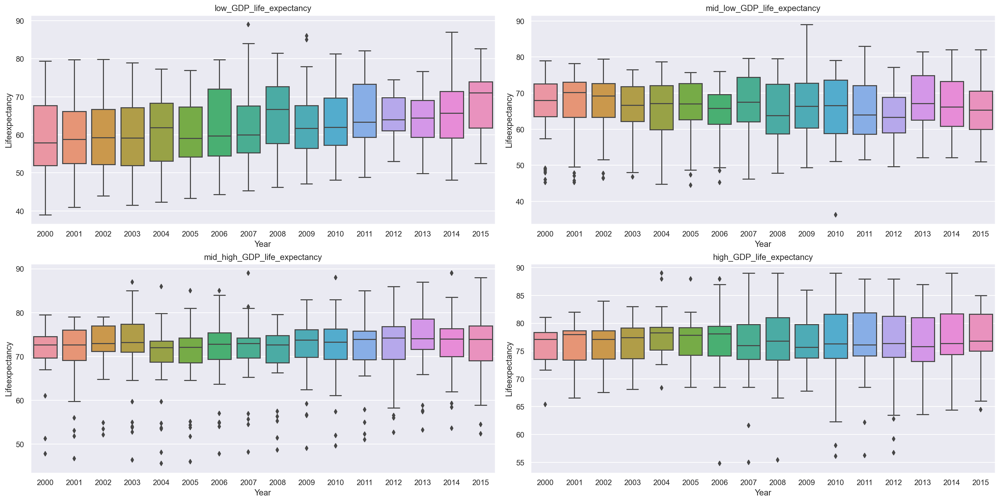

In [30]:
# 21. GDP별로 분류하여 연도에 따른 기대수명 
raw_1 = led[led["GDP_Bins"]=="low"]
raw_2 = led[led["GDP_Bins"]=="low_mid"]
raw_3 = led[led["GDP_Bins"]=="high_mid"]
raw_4 = led[led["GDP_Bins"]=="high"]

figure, ((ax1,ax2), (ax3,ax4)) = plt.subplots(nrows=2, ncols=2,constrained_layout=True)
figure.set_size_inches(20,10)

sns.boxplot(data=raw_1, x="Year", y="Lifeexpectancy", ax=ax1)
sns.boxplot(data=raw_2, x="Year", y="Lifeexpectancy", ax=ax2)
sns.boxplot(data=raw_3, x="Year", y="Lifeexpectancy", ax=ax3)
sns.boxplot(data=raw_4, x="Year", y="Lifeexpectancy", ax=ax4)

ax1.set(title="low_GDP_life_expectancy")
ax2.set(title="mid_low_GDP_life_expectancy")
ax3.set(title="mid_high_GDP_life_expectancy")
ax4.set(title="high_GDP_life_expectancy")


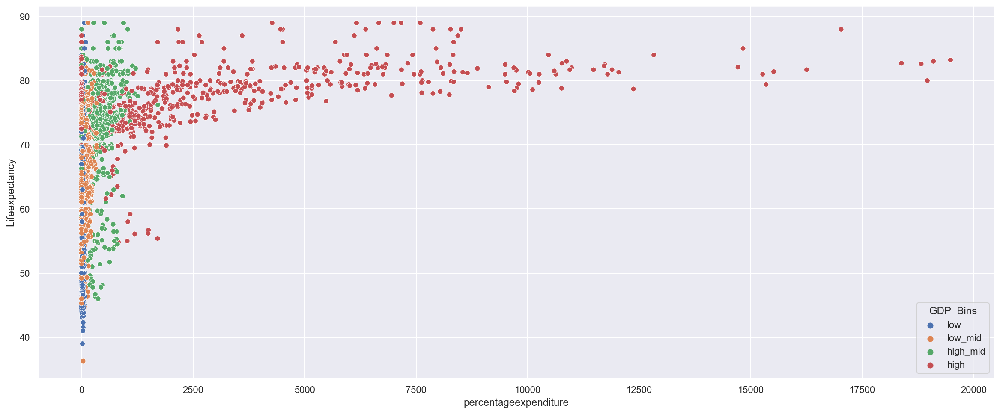

In [31]:
# 22. 1인당 국내 총생산 대비 건강에 대한 지출(%)에 따른 기대수명(GDP별)
plt.figure(figsize=(20,8))
sns.scatterplot(x='percentageexpenditure',y='Lifeexpectancy',hue='GDP_Bins',data=led);

[Text(0.5, 1.0, 'high_GDP_life_expectancy')]

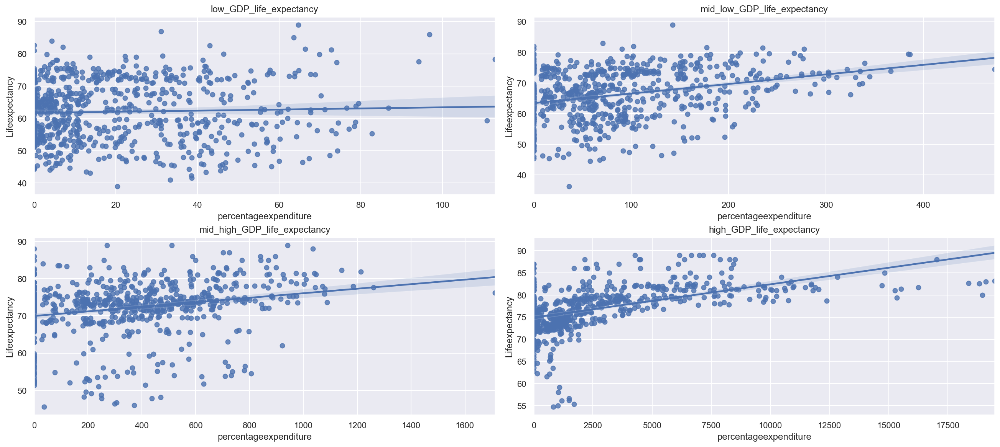

In [32]:
# 23. GDP별 1인당 국내 총생산 대비 건강에 대한 지출(%)에 따른 기대수명
raw_1 = led[led["GDP_Bins"]=="low"]
raw_2 = led[led["GDP_Bins"]=="low_mid"]
raw_3 = led[led["GDP_Bins"]=="high_mid"]
raw_4 = led[led["GDP_Bins"]=="high"]

figure, ((ax1,ax2), (ax3,ax4)) = plt.subplots(nrows=2, ncols=2,constrained_layout=True)
figure.set_size_inches(18,8)

sns.regplot(data=raw_1, x='percentageexpenditure',y='Lifeexpectancy', ax=ax1)
sns.regplot(data=raw_2, x='percentageexpenditure',y='Lifeexpectancy', ax=ax2)
sns.regplot(data=raw_3, x='percentageexpenditure',y='Lifeexpectancy', ax=ax3)
sns.regplot(data=raw_4, x='percentageexpenditure',y='Lifeexpectancy', ax=ax4)

ax1.set(title="low_GDP_life_expectancy")
ax2.set(title="mid_low_GDP_life_expectancy")
ax3.set(title="mid_high_GDP_life_expectancy")
ax4.set(title="high_GDP_life_expectancy")

<AxesSubplot:xlabel='infantdeaths', ylabel='Lifeexpectancy'>

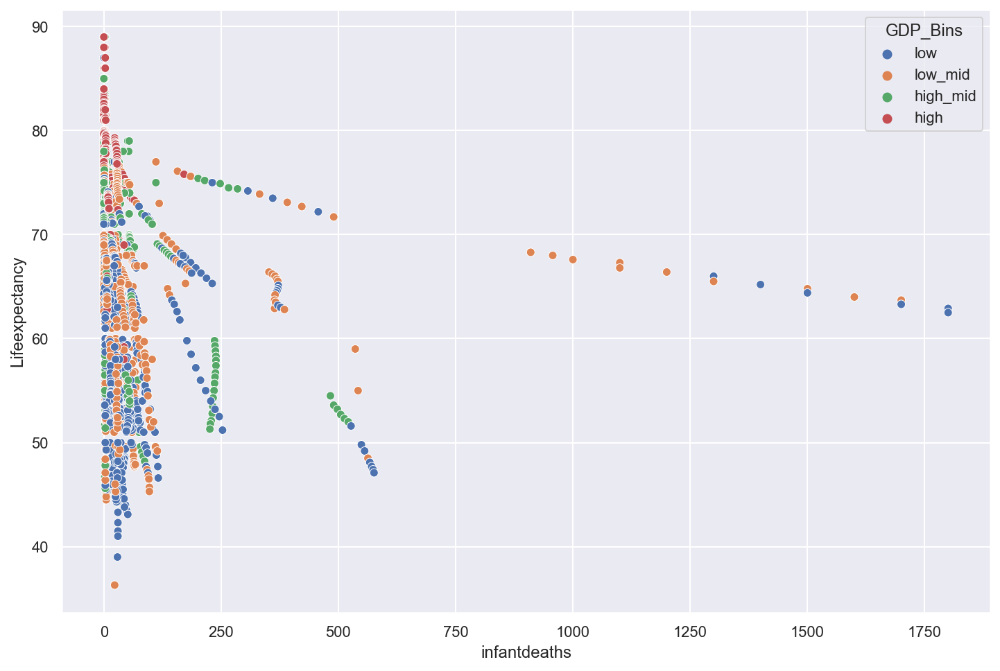

In [33]:
# 24. 인구 1000명당 유아 사망률과 기대수명은 음의 상관관계
plt.figure(figsize=(12,8))
sns.scatterplot(x='infantdeaths',y='Lifeexpectancy',hue='GDP_Bins',data=led)

[Text(0.5, 1.0, 'high_GDP_life_expectancy')]

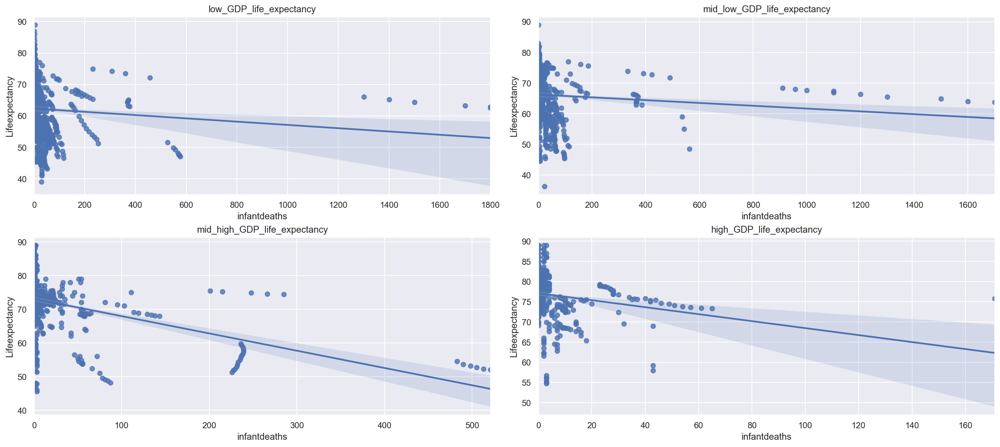

In [34]:
# 25. GDP별 인구 1000명당 유아 사망률과 기대수명
raw_1 = led[led["GDP_Bins"]=="low"]
raw_2 = led[led["GDP_Bins"]=="low_mid"]
raw_3 = led[led["GDP_Bins"]=="high_mid"]
raw_4 = led[led["GDP_Bins"]=="high"]

figure, ((ax1,ax2), (ax3,ax4)) = plt.subplots(nrows=2, ncols=2,constrained_layout=True)
figure.set_size_inches(18,8)

sns.regplot(data=raw_1, x='infantdeaths',y='Lifeexpectancy', ax=ax1)
sns.regplot(data=raw_2, x='infantdeaths',y='Lifeexpectancy', ax=ax2)
sns.regplot(data=raw_3, x='infantdeaths',y='Lifeexpectancy', ax=ax3)
sns.regplot(data=raw_4, x='infantdeaths',y='Lifeexpectancy', ax=ax4)

ax1.set(title="low_GDP_life_expectancy")
ax2.set(title="mid_low_GDP_life_expectancy")
ax3.set(title="mid_high_GDP_life_expectancy")
ax4.set(title="high_GDP_life_expectancy")

<AxesSubplot:xlabel='Alcohol', ylabel='Lifeexpectancy'>

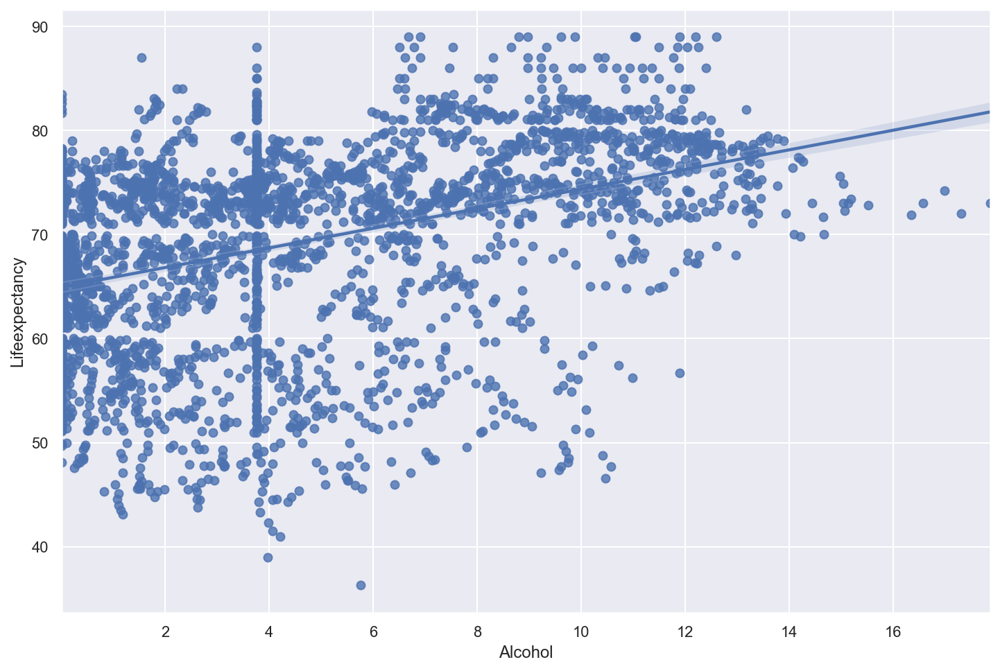

In [35]:
# 26. 1인당 소비로 기록된 알코올에 따른 기대수명 변화 
plt.figure(figsize=(12,8))
sns.regplot(x='Alcohol',y='Lifeexpectancy',data=led)

<AxesSubplot:xlabel='Alcohol', ylabel='Lifeexpectancy'>

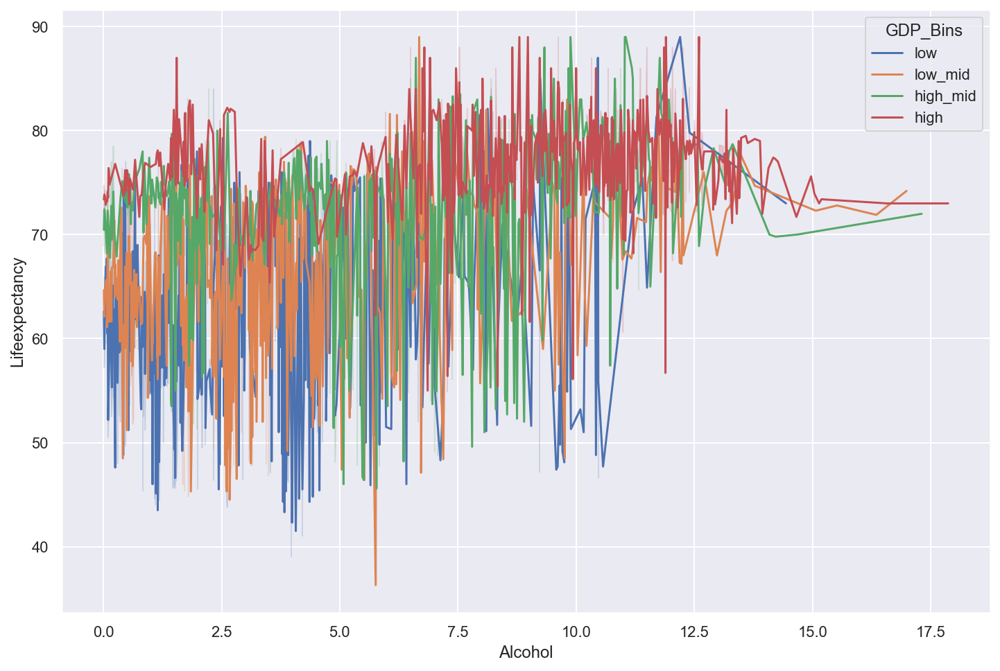

In [36]:
# 27. 1인당 소비로 기록된 알코올에 따른 기대수명 변화 
plt.figure(figsize=(12,8))
sns.lineplot(x='Alcohol',y='Lifeexpectancy',hue='GDP_Bins',data=led)

[Text(0.5, 1.0, 'high_GDP_life_expectancy')]

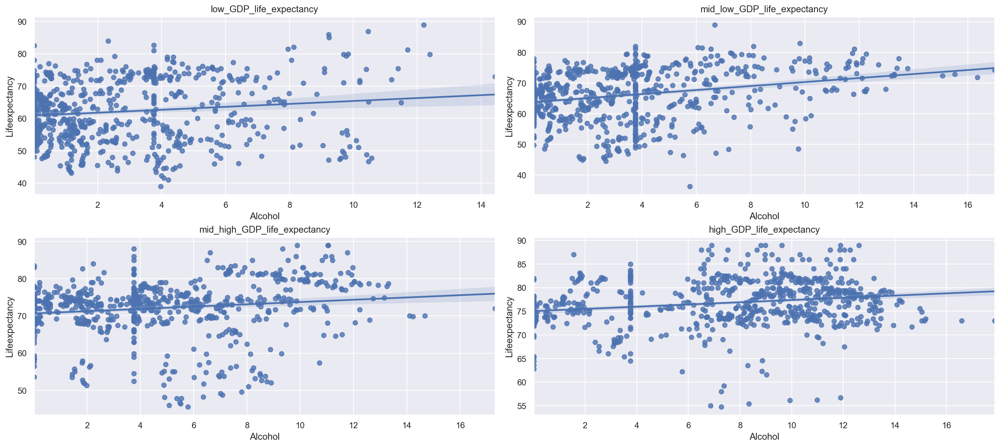

In [37]:
# 28. GDP 별 1인당 소비로 기록된 알코올에 따른 기대수명 변화 
raw_1 = led[led["GDP_Bins"]=="low"]
raw_2 = led[led["GDP_Bins"]=="low_mid"]
raw_3 = led[led["GDP_Bins"]=="high_mid"]
raw_4 = led[led["GDP_Bins"]=="high"]

figure, ((ax1,ax2), (ax3,ax4)) = plt.subplots(nrows=2, ncols=2,constrained_layout=True)
figure.set_size_inches(18,8)

sns.regplot(data=raw_1, x='Alcohol',y='Lifeexpectancy', ax=ax1)
sns.regplot(data=raw_2, x='Alcohol',y='Lifeexpectancy', ax=ax2)
sns.regplot(data=raw_3, x='Alcohol',y='Lifeexpectancy', ax=ax3)
sns.regplot(data=raw_4, x='Alcohol',y='Lifeexpectancy', ax=ax4)

ax1.set(title="low_GDP_life_expectancy")
ax2.set(title="mid_low_GDP_life_expectancy")
ax3.set(title="mid_high_GDP_life_expectancy")
ax4.set(title="high_GDP_life_expectancy")

<AxesSubplot:xlabel='BMI', ylabel='Lifeexpectancy'>

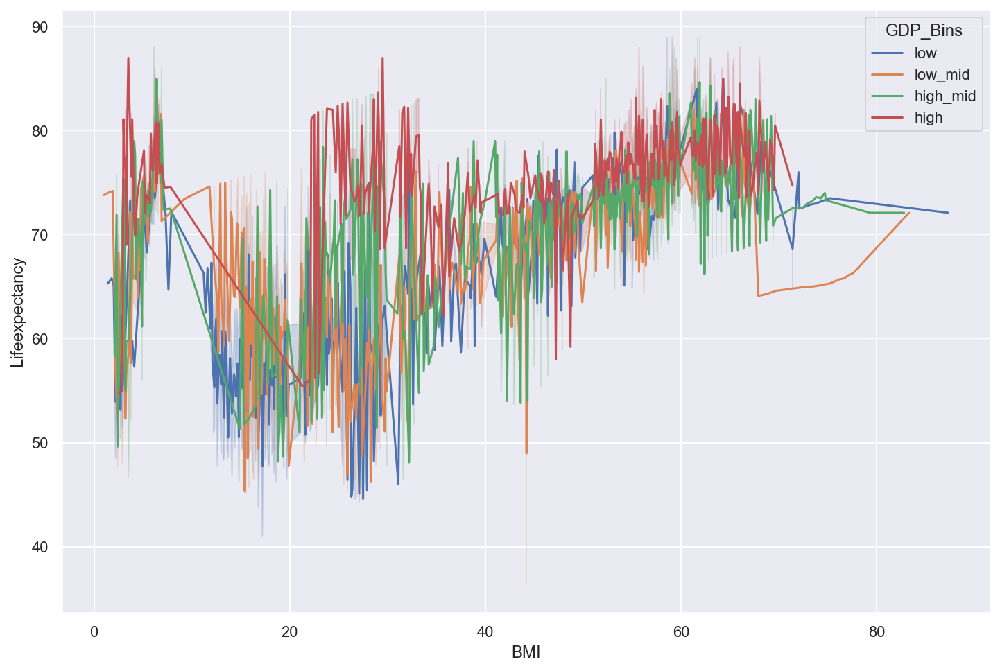

In [38]:
# 29. GDP별 BMI에 따른 기대수명
plt.figure(figsize=(12,8))
sns.lineplot(x='BMI',y='Lifeexpectancy',hue='GDP_Bins',data=led)

[Text(0.5, 1.0, 'high_GDP_life_expectancy')]

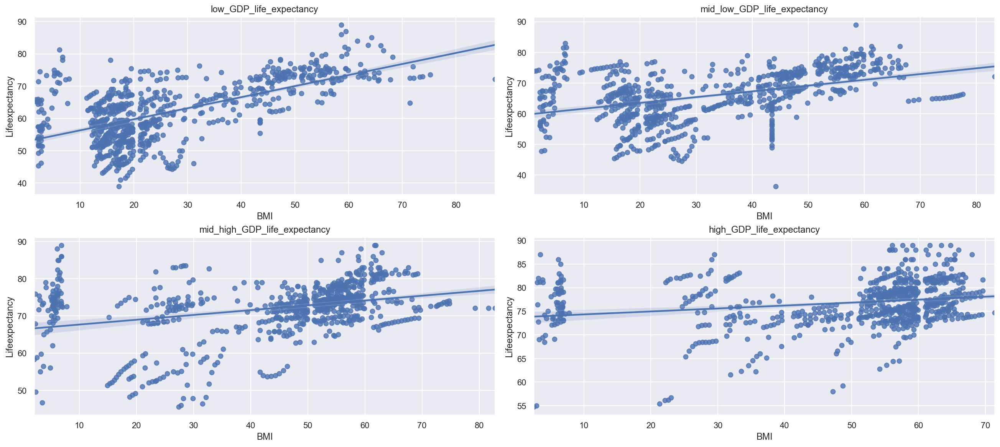

In [39]:
# 30. GDP별 BMI에 따른 기대수명
raw_1 = led[led["GDP_Bins"]=="low"]
raw_2 = led[led["GDP_Bins"]=="low_mid"]
raw_3 = led[led["GDP_Bins"]=="high_mid"]
raw_4 = led[led["GDP_Bins"]=="high"]

figure, ((ax1,ax2), (ax3,ax4)) = plt.subplots(nrows=2, ncols=2,constrained_layout=True)
figure.set_size_inches(18,8)

sns.regplot(data=raw_1, x='BMI',y='Lifeexpectancy', ax=ax1)
sns.regplot(data=raw_2, x='BMI',y='Lifeexpectancy', ax=ax2)
sns.regplot(data=raw_3, x='BMI',y='Lifeexpectancy', ax=ax3)
sns.regplot(data=raw_4, x='BMI',y='Lifeexpectancy', ax=ax4)

ax1.set(title="low_GDP_life_expectancy")
ax2.set(title="mid_low_GDP_life_expectancy")
ax3.set(title="mid_high_GDP_life_expectancy")
ax4.set(title="high_GDP_life_expectancy")

<AxesSubplot:xlabel='Polio', ylabel='Lifeexpectancy'>

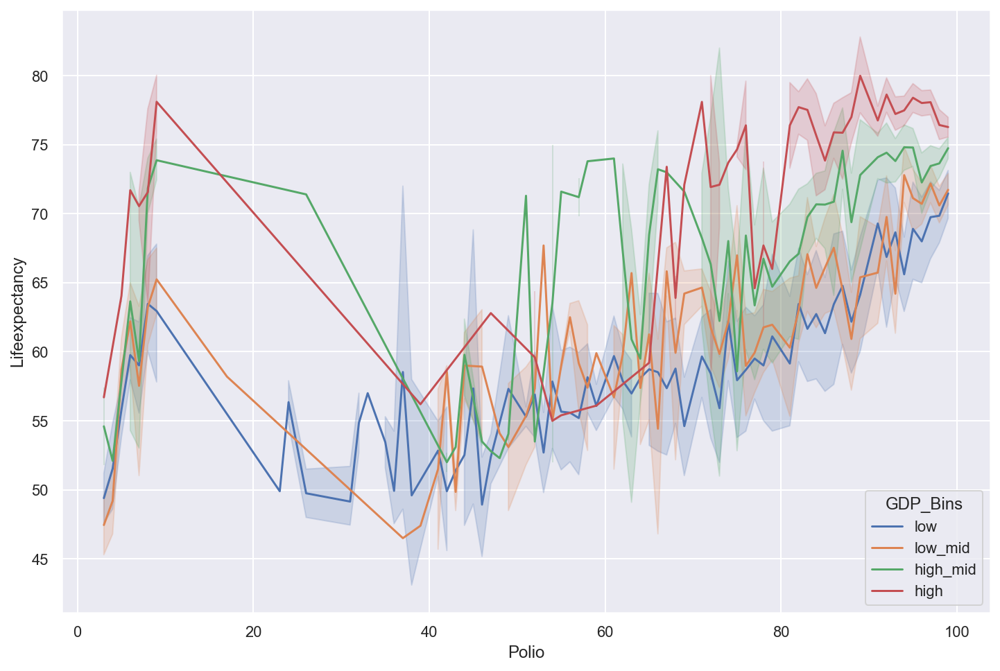

In [40]:
# 31. GDP별 Polio(소아마비)접종률에 따른 기대수명
plt.figure(figsize=(12,8))
sns.lineplot(x='Polio',y='Lifeexpectancy',hue='GDP_Bins',data=led)

[Text(0.5, 1.0, 'high_GDP_life_expectancy')]

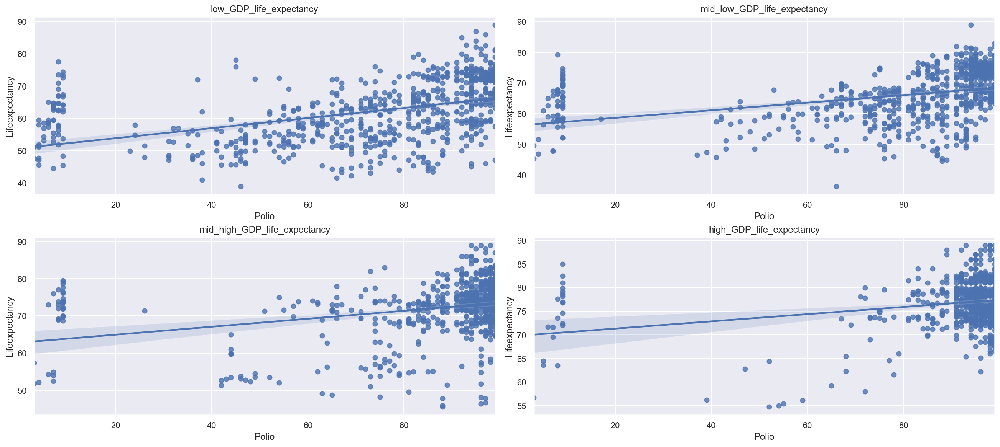

In [41]:
# 32. GDP별 Polio(소아마비)접종률 에 따른 기대수명
raw_1 = led[led["GDP_Bins"]=="low"]
raw_2 = led[led["GDP_Bins"]=="low_mid"]
raw_3 = led[led["GDP_Bins"]=="high_mid"]
raw_4 = led[led["GDP_Bins"]=="high"]

figure, ((ax1,ax2), (ax3,ax4)) = plt.subplots(nrows=2, ncols=2,constrained_layout=True)
figure.set_size_inches(18,8)

sns.regplot(data=raw_1, x='Polio',y='Lifeexpectancy', ax=ax1)
sns.regplot(data=raw_2, x='Polio',y='Lifeexpectancy', ax=ax2)
sns.regplot(data=raw_3, x='Polio',y='Lifeexpectancy', ax=ax3)
sns.regplot(data=raw_4, x='Polio',y='Lifeexpectancy', ax=ax4)

ax1.set(title="low_GDP_life_expectancy")
ax2.set(title="mid_low_GDP_life_expectancy")
ax3.set(title="mid_high_GDP_life_expectancy")
ax4.set(title="high_GDP_life_expectancy")

<AxesSubplot:xlabel='Diphtheria', ylabel='Lifeexpectancy'>

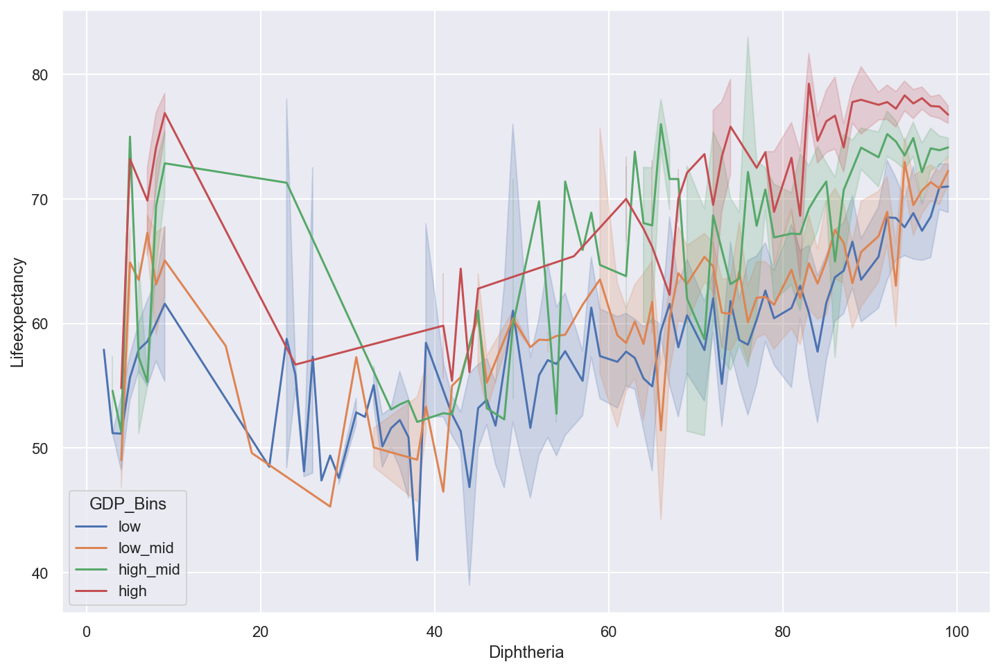

In [42]:
# 32. GDP별 Diphtheria(파상풍) 접종률에 따른 기대수명
plt.figure(figsize=(12,8))
sns.lineplot(x='Diphtheria',y='Lifeexpectancy',hue='GDP_Bins',data=led)

[Text(0.5, 1.0, 'high_GDP_life_expectancy')]

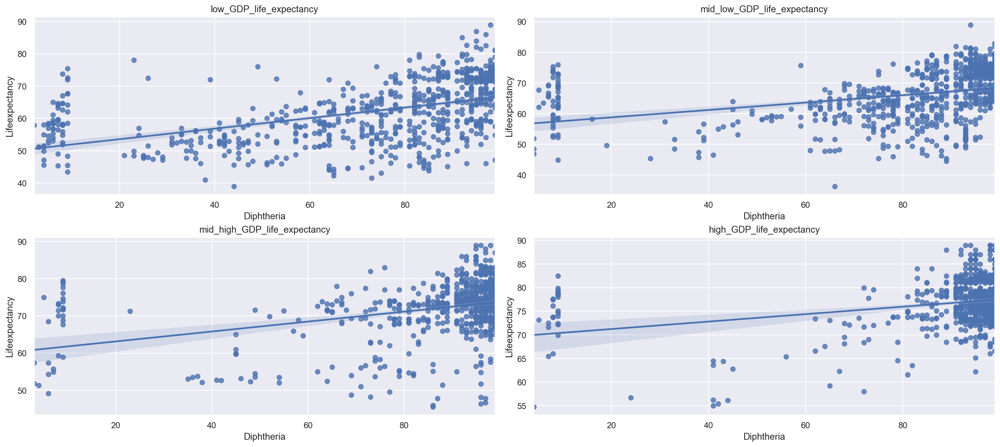

In [43]:
# 33. GDP별 Diphtheria(파상풍) 접종률에 따른 기대수명
raw_1 = led[led["GDP_Bins"]=="low"]
raw_2 = led[led["GDP_Bins"]=="low_mid"]
raw_3 = led[led["GDP_Bins"]=="high_mid"]
raw_4 = led[led["GDP_Bins"]=="high"]

figure, ((ax1,ax2), (ax3,ax4)) = plt.subplots(nrows=2, ncols=2,constrained_layout=True)
figure.set_size_inches(18,8)

sns.regplot(data=raw_1, x='Diphtheria',y='Lifeexpectancy', ax=ax1)
sns.regplot(data=raw_2, x='Diphtheria',y='Lifeexpectancy', ax=ax2)
sns.regplot(data=raw_3, x='Diphtheria',y='Lifeexpectancy', ax=ax3)
sns.regplot(data=raw_4, x='Diphtheria',y='Lifeexpectancy', ax=ax4)

ax1.set(title="low_GDP_life_expectancy")
ax2.set(title="mid_low_GDP_life_expectancy")
ax3.set(title="mid_high_GDP_life_expectancy")
ax4.set(title="high_GDP_life_expectancy")

<AxesSubplot:xlabel='Incomecompositionofresources', ylabel='Lifeexpectancy'>

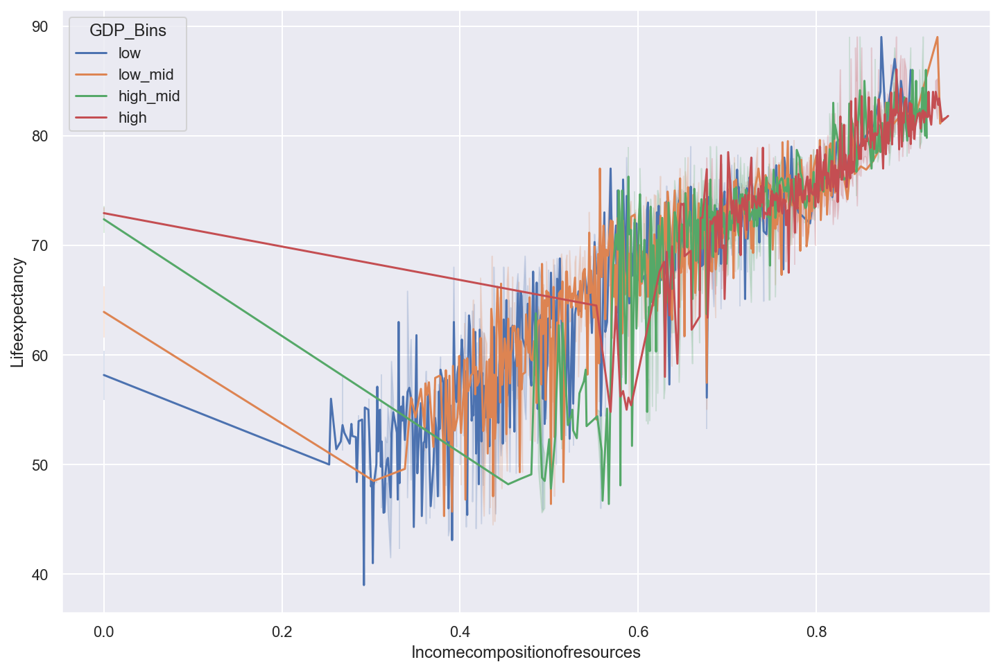

In [44]:
# 34. GDP별 정부의 건강에 대한 지출률에 따른 기대수명
plt.figure(figsize=(12,8))
sns.lineplot(x='Incomecompositionofresources',y='Lifeexpectancy',hue='GDP_Bins',data=led)

[Text(0.5, 1.0, 'high_GDP_life_expectancy')]

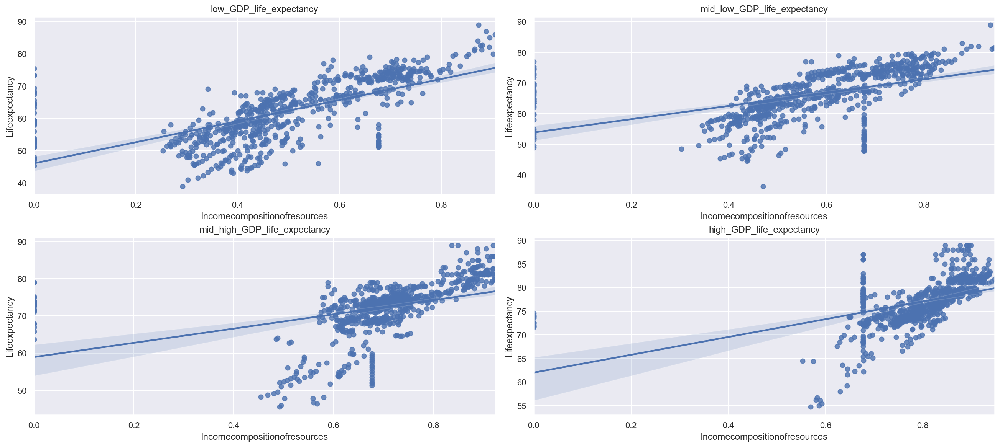

In [45]:
# 35. GDP별 정부의 건강에 대한 지출률에 따른 기대수명
raw_1 = led[led["GDP_Bins"]=="low"]
raw_2 = led[led["GDP_Bins"]=="low_mid"]
raw_3 = led[led["GDP_Bins"]=="high_mid"]
raw_4 = led[led["GDP_Bins"]=="high"]

figure, ((ax1,ax2), (ax3,ax4)) = plt.subplots(nrows=2, ncols=2,constrained_layout=True)
figure.set_size_inches(18,8)

sns.regplot(data=raw_1, x='Incomecompositionofresources',y='Lifeexpectancy', ax=ax1)
sns.regplot(data=raw_2, x='Incomecompositionofresources',y='Lifeexpectancy', ax=ax2)
sns.regplot(data=raw_3, x='Incomecompositionofresources',y='Lifeexpectancy', ax=ax3)
sns.regplot(data=raw_4, x='Incomecompositionofresources',y='Lifeexpectancy', ax=ax4)

ax1.set(title="low_GDP_life_expectancy")
ax2.set(title="mid_low_GDP_life_expectancy")
ax3.set(title="mid_high_GDP_life_expectancy")
ax4.set(title="high_GDP_life_expectancy")

<AxesSubplot:xlabel='Schooling', ylabel='Lifeexpectancy'>

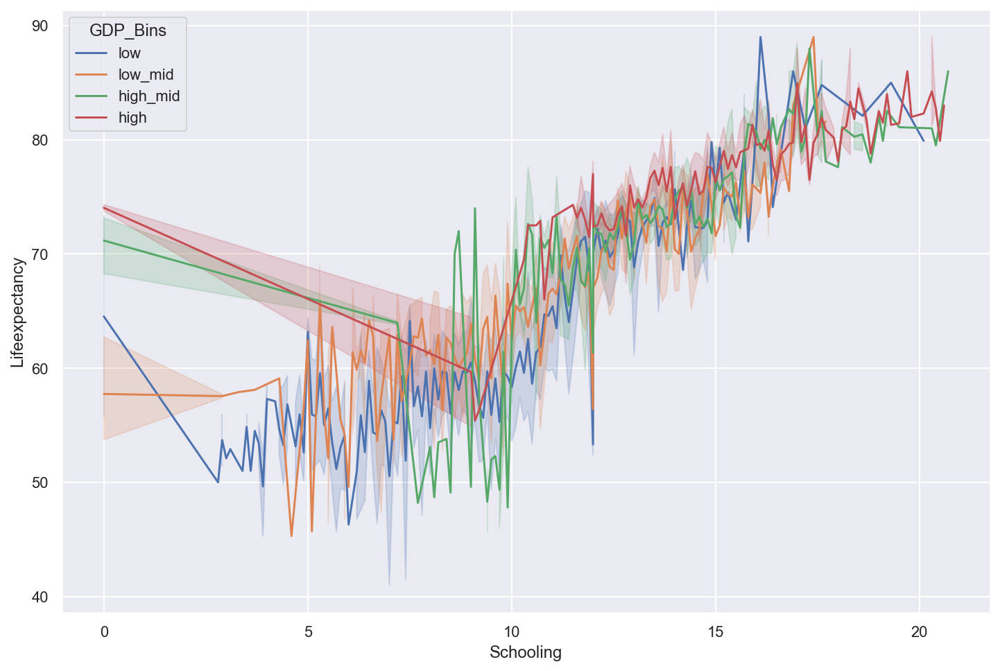

In [46]:
# 36. GDP별 교육정도에 따른 기대수명
plt.figure(figsize=(12,8))
sns.lineplot(x='Schooling',y='Lifeexpectancy',hue='GDP_Bins',data=led)

[Text(0.5, 1.0, 'high_GDP_life_expectancy')]

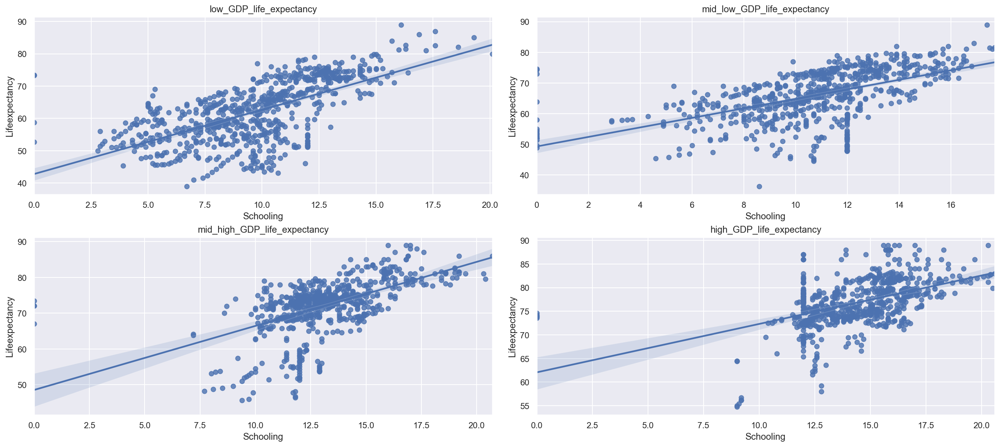

In [47]:
# 37. GDP별 교육정도에 따른 기대수명
raw_1 = led[led["GDP_Bins"]=="low"]
raw_2 = led[led["GDP_Bins"]=="low_mid"]
raw_3 = led[led["GDP_Bins"]=="high_mid"]
raw_4 = led[led["GDP_Bins"]=="high"]

figure, ((ax1,ax2), (ax3,ax4)) = plt.subplots(nrows=2, ncols=2,constrained_layout=True)
figure.set_size_inches(18,8)

sns.regplot(data=raw_1, x='Schooling',y='Lifeexpectancy', ax=ax1)
sns.regplot(data=raw_2, x='Schooling',y='Lifeexpectancy', ax=ax2)
sns.regplot(data=raw_3, x='Schooling',y='Lifeexpectancy', ax=ax3)
sns.regplot(data=raw_4, x='Schooling',y='Lifeexpectancy', ax=ax4)

ax1.set(title="low_GDP_life_expectancy")
ax2.set(title="mid_low_GDP_life_expectancy")
ax3.set(title="mid_high_GDP_life_expectancy")
ax4.set(title="high_GDP_life_expectancy")

In [48]:
# 38. 데이터 확인 
led.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Unnamed: 0                    2938 non-null   int64   
 1   Country                       2938 non-null   object  
 2   Year                          2938 non-null   int64   
 3   Status                        2938 non-null   object  
 4   Lifeexpectancy                2938 non-null   float64 
 5   AdultMortality                2938 non-null   float64 
 6   infantdeaths                  2938 non-null   int64   
 7   Alcohol                       2938 non-null   float64 
 8   percentageexpenditure         2938 non-null   float64 
 9   HepatitisB                    2938 non-null   float64 
 10  Measles                       2938 non-null   int64   
 11  BMI                           2938 non-null   float64 
 12  under-fivedeaths              2938 non-null   in

In [49]:
# 39. 사용하지 않는 데이터 제거
led.drop(columns=['Country','Status'], inplace=True)
led.drop(columns='GDP_Bins', inplace=True)

In [50]:
# 40. data모두 실수로 변환
led = led.astype('float')
led.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Unnamed: 0                    2938 non-null   float64
 1   Year                          2938 non-null   float64
 2   Lifeexpectancy                2938 non-null   float64
 3   AdultMortality                2938 non-null   float64
 4   infantdeaths                  2938 non-null   float64
 5   Alcohol                       2938 non-null   float64
 6   percentageexpenditure         2938 non-null   float64
 7   HepatitisB                    2938 non-null   float64
 8   Measles                       2938 non-null   float64
 9   BMI                           2938 non-null   float64
 10  under-fivedeaths              2938 non-null   float64
 11  Polio                         2938 non-null   float64
 12  Totalexpenditure              2938 non-null   float64
 13  Dip

In [51]:
# 41. 데이터 나누기
from sklearn.model_selection import train_test_split
X = led.drop('Lifeexpectancy', axis=1)
y = led['Lifeexpectancy']

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

In [52]:
# 42. 선형회귀모델 만들기
import statsmodels.api as sm

lm = sm.OLS(y_train, X_train).fit()
lm.summary()
# R-squared:0.997 -> 좋은 모델
# 경고메세지 1 
# 경고메세지 2 
# 경고메세지 3 조건수가 너무 큼, 강한 다중공선성이 있을 수 있음. -> 스케일링 필요(더미변수 제외)

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:         Lifeexpectancy   R-squared (uncentered):                   0.997
Model:                            OLS   Adj. R-squared (uncentered):              0.997
Method:                 Least Squares   F-statistic:                          2.550e+04
Date:                Wed, 12 May 2021   Prob (F-statistic):                        0.00
Time:                        16:52:21   Log-Likelihood:                         -5777.9
No. Observations:                2056   AIC:                                  1.160e+04
Df Residuals:                    2032   BIC:                                  1.174e+04
Df Model:                          24                                                  
Covariance Type:            nonrobust                                                  
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Unnamed: 0                       0.0004      0.000      3.284      0.001       0.000       0.001
Year                             0.0266      0.002     12.992      0.000       0.023       0.031
AdultMortality                  -0.0189      0.001    -19.436      0.000      -0.021      -0.017
infantdeaths                     0.0964      0.010     10.075      0.000       0.078       0.115
Alcohol                          0.0995      0.029      3.382      0.001       0.042       0.157
percentageexpenditure         7.446e-05   7.36e-05      1.012      0.312   -6.99e-05       0.000
HepatitisB                      -0.0140      0.004     -3.219      0.001      -0.023      -0.005
Measles                      -2.274e-05   8.71e-06     -2.610      0.009   -3.98e-05   -5.65e-06
BMI                              0.0335      0.006      5.653      0.000       0.022       0.045
under-fivedeaths                -0.0717      0.007    -10.224      0.000      -0.085      -0.058
Polio                            0.0252      0.005      4.651      0.000       0.015       0.036
Totalexpenditure                 0.0693      0.040      1.744      0.081      -0.009       0.147
Diphtheria                       0.0376      0.006      6.794      0.000       0.027       0.048
HIV/AIDS                        -0.4645      0.021    -22.030      0.000      -0.506      -0.423
GDP                           3.969e-05   1.26e-05      3.149      0.002     1.5e-05    6.44e-05
Population                    4.466e-10   1.87e-09      0.239      0.811   -3.21e-09    4.11e-09
thinness1-19years               -0.1094      0.067     -1.638      0.102      -0.240       0.022
thinness5-9years                 0.0293      0.065      0.447      0.655      -0.099       0.158
Incomecompositionofresources     5.0374      0.734      6.864      0.000       3.598       6.477
Schooling                        0.6555      0.049     13.312      0.000       0.559       0.752
section_low                      0.9947      4.033      0.247      0.805      -6.914       8.903
section_low_mid                  1.6723      4.032      0.415      0.678      -6.234       9.579
section_high_mid                 3.1196      4.031      0.774      0.439      -4.785      11.024
section_high                     3.1144      4.041      0.771      0.441      -4.811      11.040
==============================================================================
Omnibus:                       71.863   Durbin-Watson:                   1.953
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              191.683
Skew:                          -0.082   Prob(JB):                     2.38e-42
Kurtosis:                       4.487   Cond. No.

In [53]:
# 43. 다중공산성 변수를 찾기 위한 VIF계산
from statsmodels.stats.outliers_influence import variance_inflation_factor

sm.OLS(y_train, X_train).exog_names

['Unnamed: 0',
 'Year',
 'AdultMortality',
 'infantdeaths',
 'Alcohol',
 'percentageexpenditure',
 'HepatitisB',
 'Measles',
 'BMI',
 'under-fivedeaths',
 'Polio',
 'Totalexpenditure',
 'Diphtheria',
 'HIV/AIDS',
 'GDP',
 'Population',
 'thinness1-19years',
 'thinness5-9years',
 'Incomecompositionofresources',
 'Schooling',
 'section_low',
 'section_low_mid',
 'section_high_mid',
 'section_high']

In [54]:
# 높게 나타나면 상관성이 높은것..(10보다 크면 크다고 할 수 있음)
# 계수가 통계적으로 유의미하지 않다면 대처
# 계수가 통계적으로 유의미하다면 VIF 크더라도 괜찮음
# 변수를 더하거나 빼서 새로운 변수 만들기(두 예측변수를 빼거나 더해도 문제 없을 경우)
# 더하거나 빼기 어려운 경우 변수 모형에서 제거
pd.DataFrame({'컬럼': column, 'VIF': variance_inflation_factor(sm.OLS(y_train, X_train).exog, i)} 
             for i, column in enumerate(sm.OLS(y_train, X_train).exog_names)
             if column != 'Intercept')  # 절편의 VIF는 구하지 않는다.


,컬럼,VIF
0,Unnamed: 0,4.219702
1,Year,2126.598403
2,AdultMortality,5.139768
3,infantdeaths,197.708249
4,Alcohol,3.964862
5,percentageexpenditure,3.081441
6,HepatitisB,17.623971
7,Measles,1.408222
8,BMI,8.283418
9,under-fivedeaths,198.107835


In [55]:
# 44. 예측
predictions = lm.predict(X_test)
predictions


2034    68.137225
2632    57.222442
1404    77.082309
1174    78.613084
2856    61.779095
          ...    
1787    60.442964
1853    80.830483
1153    66.007033
2195    72.780293
1099    62.155111
Length: 882, dtype: float64

In [56]:
# 45. 실체 test 값
y_test

2034    67.3
2632    54.6
1404    73.6
1174    82.1
2856    69.1
        ... 
1787    59.2
1853    81.0
1153    71.0
2195    71.2
1099    54.4
Name: Lifeexpectancy, Length: 882, dtype: float64

/Users/ijuyeong/miniforge3/envs/tf5/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


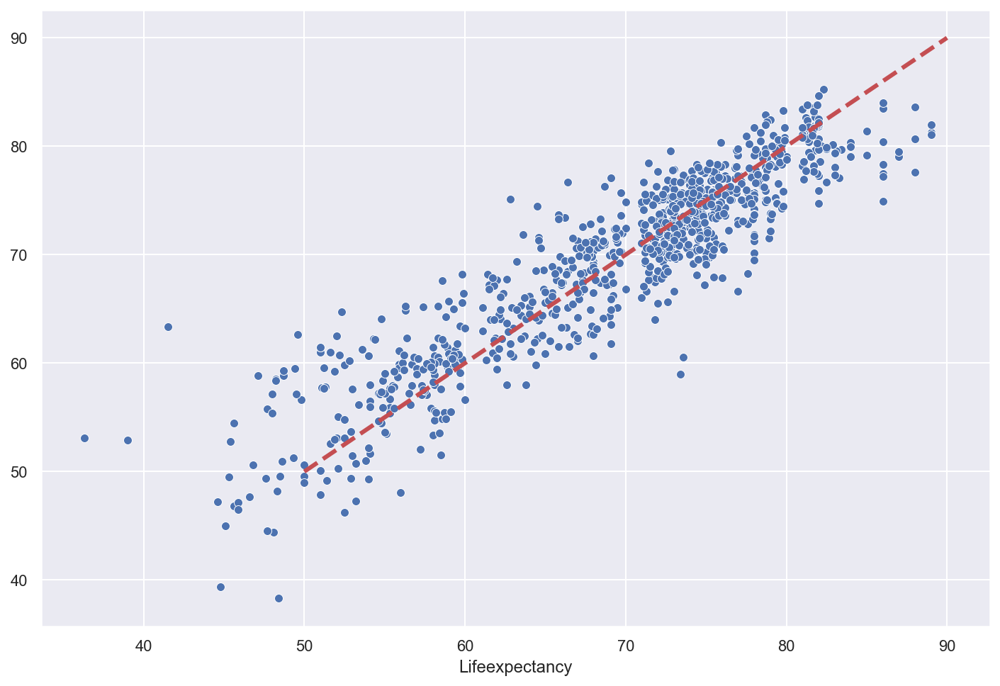

In [57]:
# 46. 참값과 예측값의 직관적 비교
sns.scatterplot(y_test, predictions);
plt.plot([50,90],[50,90], 'r',ls='dashed',lw=3);

## LinearRegression

In [58]:
# 47. 모델학습
from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train, y_train)

LinearRegression()

                                  Linear Regression
                            MSE of Train Data :  16.05331621483873
                            MSE of Test Data :  15.209844471268232
                            RMSE of Train Data :  4.006658984096192
                            RMSE of Test Data :  3.8999800603680312


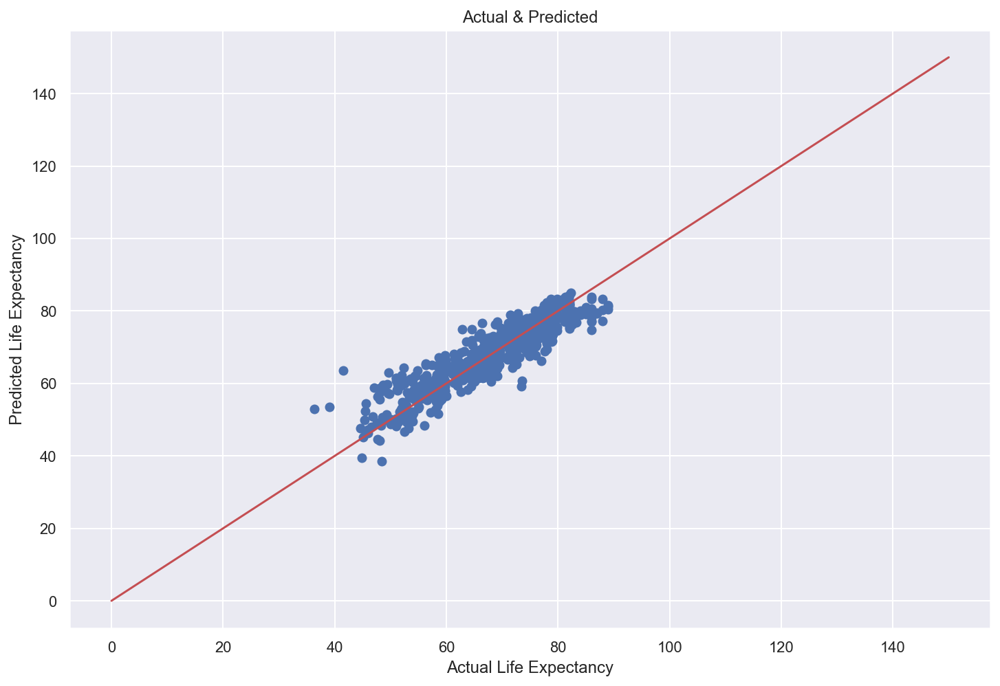

In [59]:
# 48. 모델 평가
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))

r_tr = r2_score(y_train,pred_tr)
r_test = r2_score(y_train,pred_tr)
print("                                  Linear Regression")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');

In [60]:
# 50. scailing

from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler

mm = MinMaxScaler()
ss = StandardScaler()
rs = RobustScaler()

X_ss = ss.fit_transform(X)
X_mm = mm.fit_transform(X)
X_rs = rs.fit_transform(X)

X_ss_pd = pd.DataFrame(X_ss, columns=X.columns)
X_mm_pd = pd.DataFrame(X_mm, columns=X.columns)
X_rs_pd = pd.DataFrame(X_rs, columns=X.columns)

                               Linear Regression & StandardScaler
                            MSE of Train Data :  7365.873426277533
                            MSE of Test Data :  7378.214099358282
                            RMSE of Train Data :  85.82466677055923
                            RMSE of Test Data :  85.89653135813042


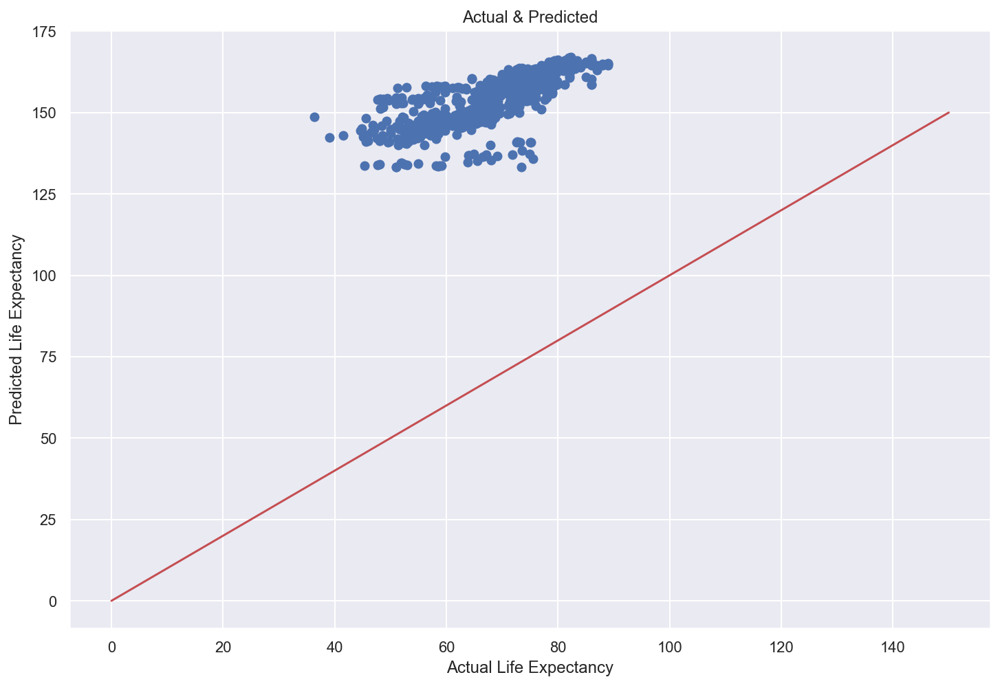

In [61]:
# StandardScaler
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train, y_train)


X_train, X_test, y_train, y_test = train_test_split(X_ss_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))

print("                               Linear Regression & StandardScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');



                               Linear Regression & MinMaxScaler
                            MSE of Train Data :  75.756035111907
                            MSE of Test Data :  76.0198933286093
                            RMSE of Train Data :  8.703794293979321
                            RMSE of Test Data :  8.718938773073779


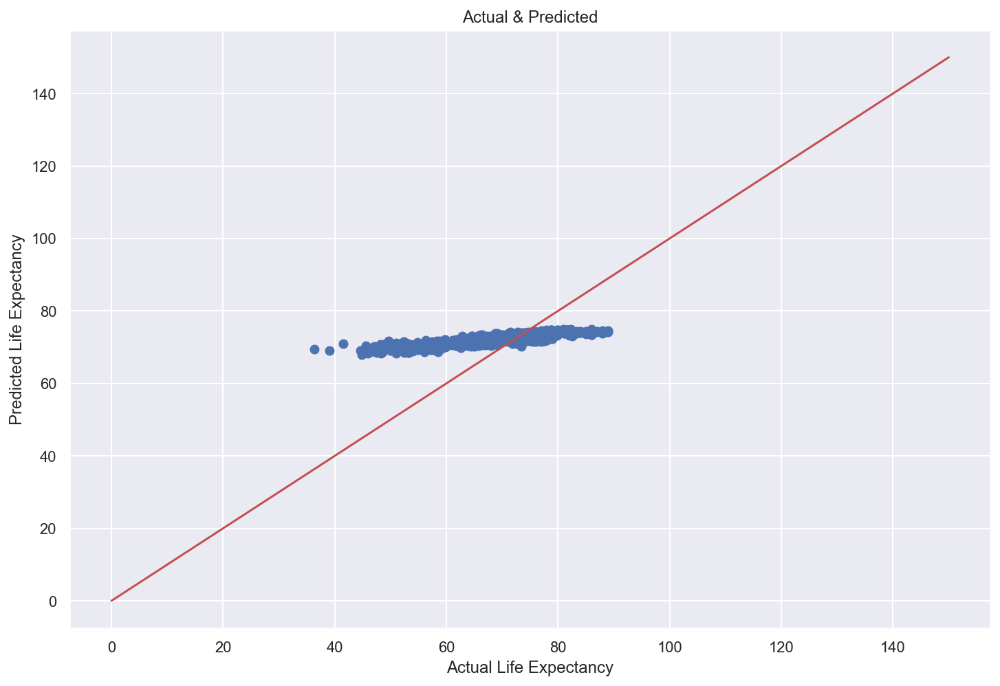

In [62]:
# MinMaxScaler 
from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train, y_train)

X_train, X_test, y_train, y_test = train_test_split(X_mm_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))
print("                               Linear Regression & MinMaxScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');

                               Linear Regression & RobustScaler
                            MSE of Train Data :  83701.92062414256
                            MSE of Test Data :  64282.37531404463
                            RMSE of Train Data :  289.3128421348464
                            RMSE of Test Data :  253.53969179212282


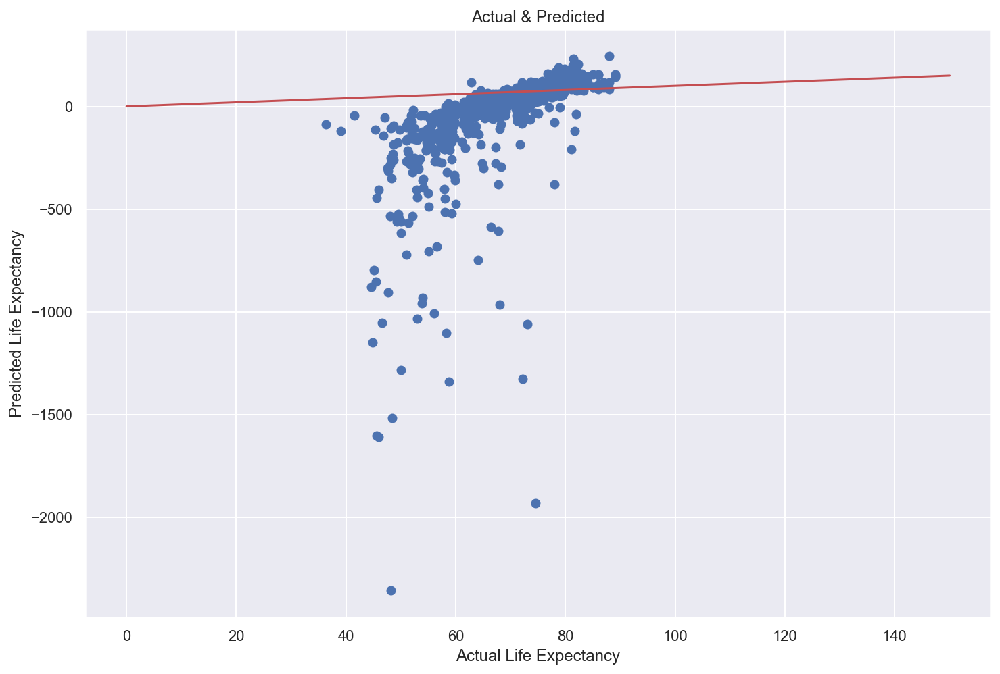

In [63]:
# RobustScaler

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

reg = Ridge()
reg.fit(X_train, y_train)

X_train, X_test, y_train, y_test = train_test_split(X_rs_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))

print("                               Linear Regression & RobustScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');

## Ridge

                                       Ridge & StandardScaler
                            MSE of Train Data :  26.362533835417114
                            MSE of Test Data :  26.532962938905868
                            RMSE of Train Data :  5.1344458158030175
                            RMSE of Test Data :  5.15101571914762


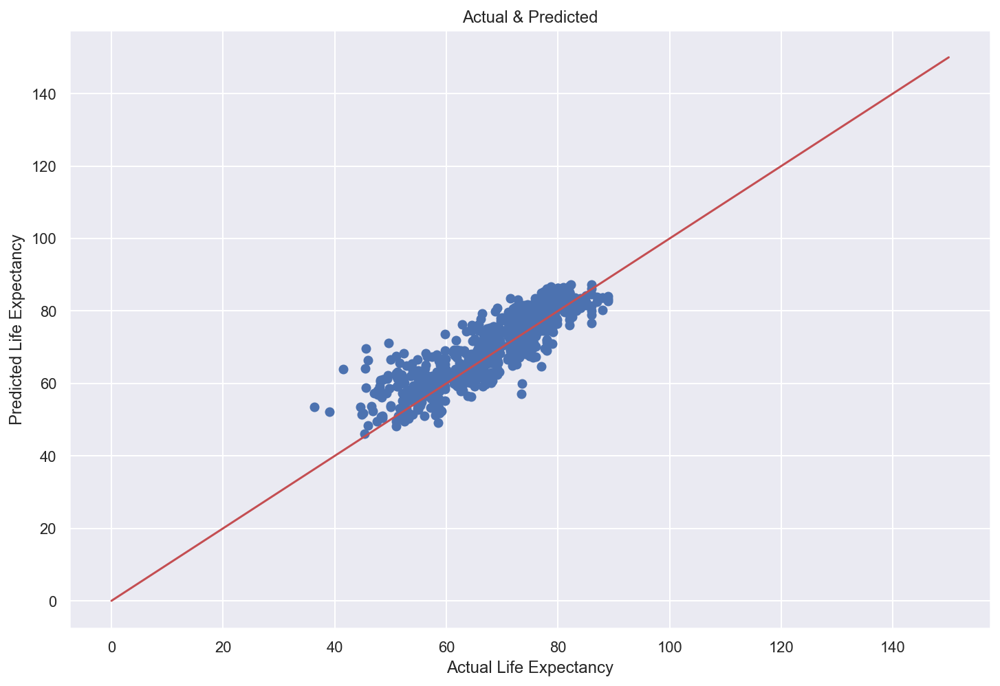

In [64]:
# StandardScaler
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

reg = Ridge()
reg.fit(X_train, y_train)


X_train, X_test, y_train, y_test = train_test_split(X_ss_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))

print("                                       Ridge & StandardScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');



                                    Ridge & MinMaxScaler
                            MSE of Train Data :  75.31846648771827
                            MSE of Test Data :  75.57090434628562
                            RMSE of Train Data :  8.678621231953741
                            RMSE of Test Data :  8.693152727652127


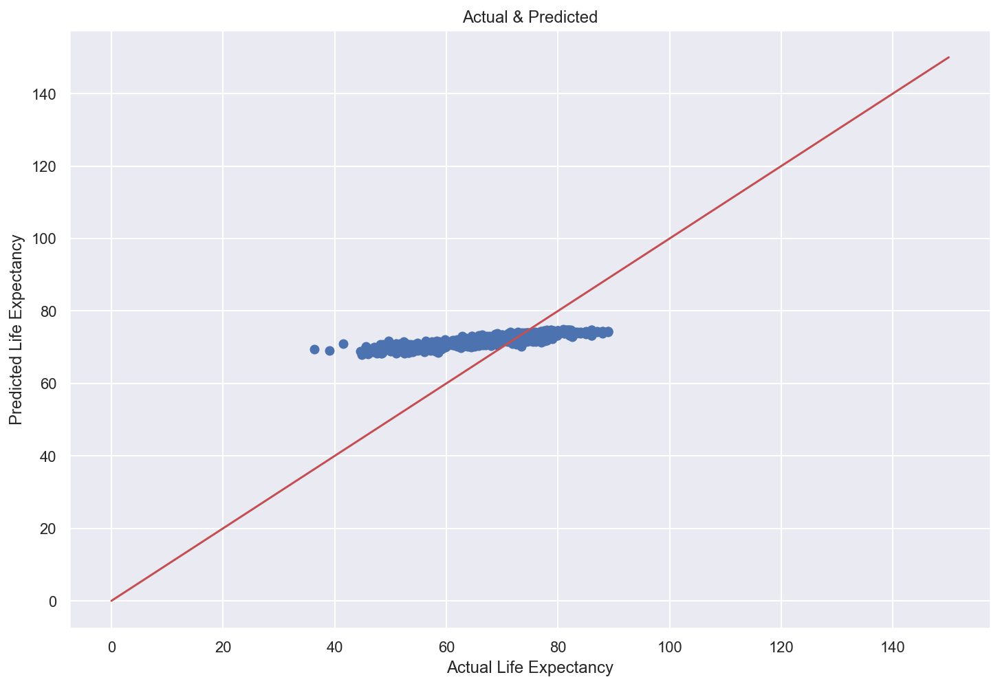

In [65]:
# MinMaxScaler 
from sklearn.linear_model import LinearRegression

reg = Ridge()
reg.fit(X_train, y_train)

X_train, X_test, y_train, y_test = train_test_split(X_mm_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))
print("                                    Ridge & MinMaxScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');

                                      Ridge & RobustScaler
                            MSE of Train Data :  83701.92062414256
                            MSE of Test Data :  64282.37531404463
                            RMSE of Train Data :  289.3128421348464
                            RMSE of Test Data :  253.53969179212282


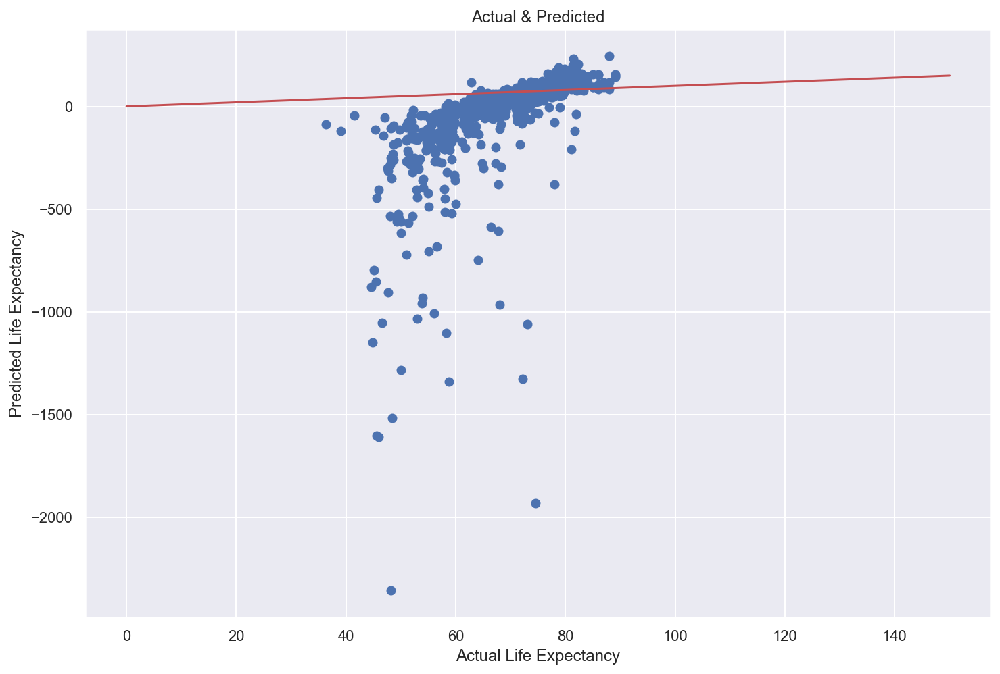

In [66]:
# RobustScaler

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

reg = Ridge()
reg.fit(X_train, y_train)

X_train, X_test, y_train, y_test = train_test_split(X_rs_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))

print("                                      Ridge & RobustScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');

## Lasso

                                     Lasso & StandardScaler
                            MSE of Train Data :  33.1567654358736
                            MSE of Test Data :  32.34734633753889
                            RMSE of Train Data :  5.758191160066988
                            RMSE of Test Data :  5.687472754883217


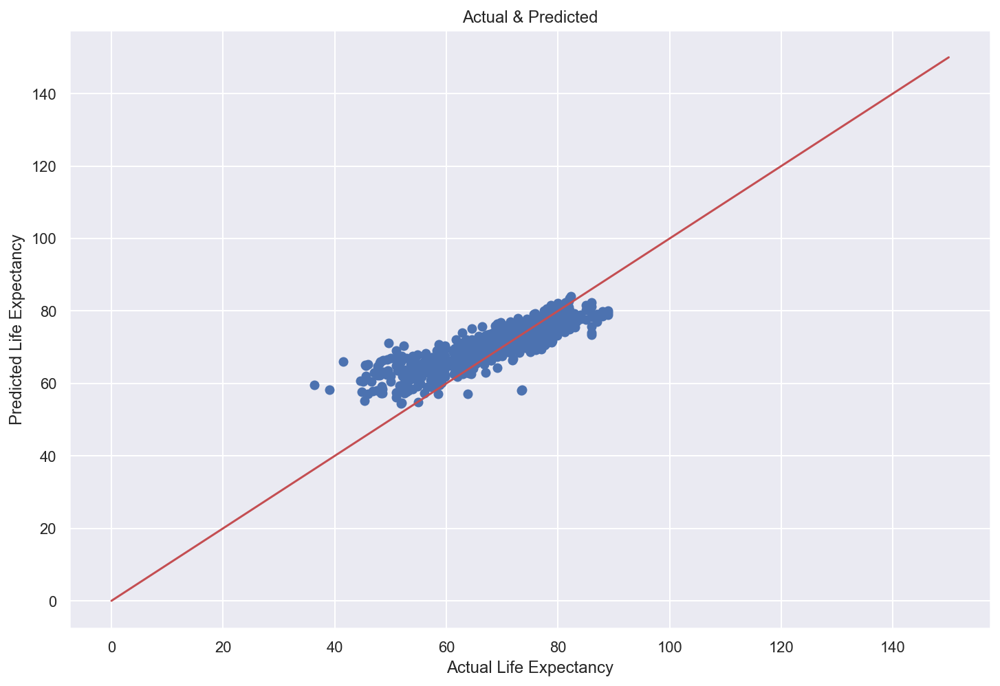

In [67]:
# StandardScaler
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

reg = Lasso()
reg.fit(X_train, y_train)


X_train, X_test, y_train, y_test = train_test_split(X_ss_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))

print("                                     Lasso & StandardScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');



                                    Lasso & MinMaxScaler
                            MSE of Train Data :  78.03947313613703
                            MSE of Test Data :  78.25197665039417
                            RMSE of Train Data :  8.833995309945383
                            RMSE of Test Data :  8.846014732657535


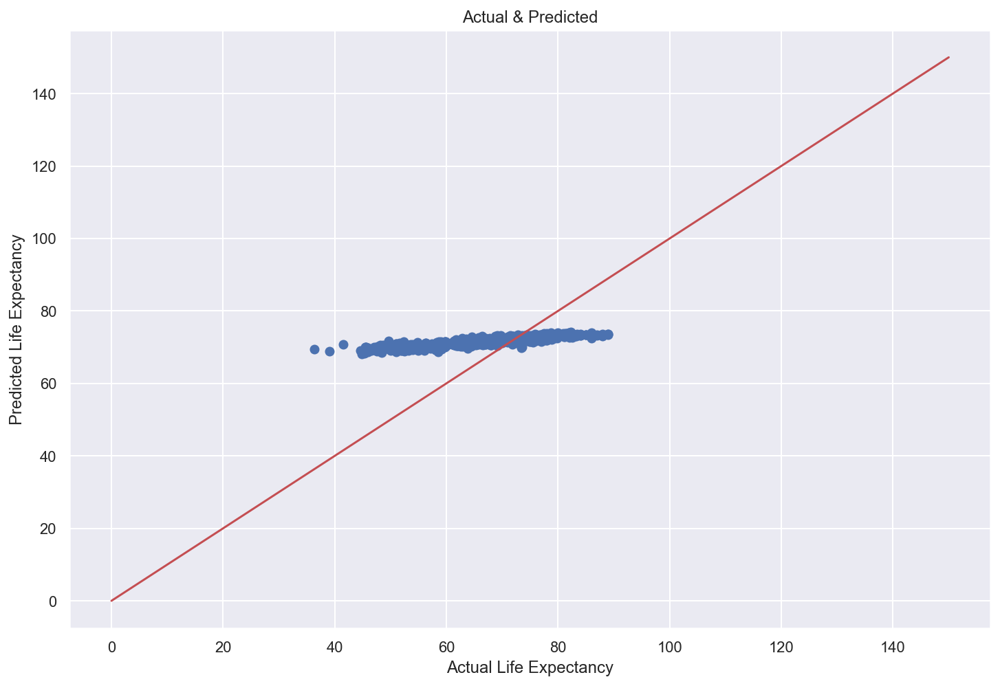

In [68]:
# MinMaxScaler 
from sklearn.linear_model import LinearRegression

reg = Lasso()
reg.fit(X_train, y_train)

X_train, X_test, y_train, y_test = train_test_split(X_mm_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))
print("                                    Lasso & MinMaxScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');

                                     Lasso & RobustScaler
                            MSE of Train Data :  58.260420077832386
                            MSE of Test Data :  57.88569871222287
                            RMSE of Train Data :  7.63285137270682
                            RMSE of Test Data :  7.6082651578545075


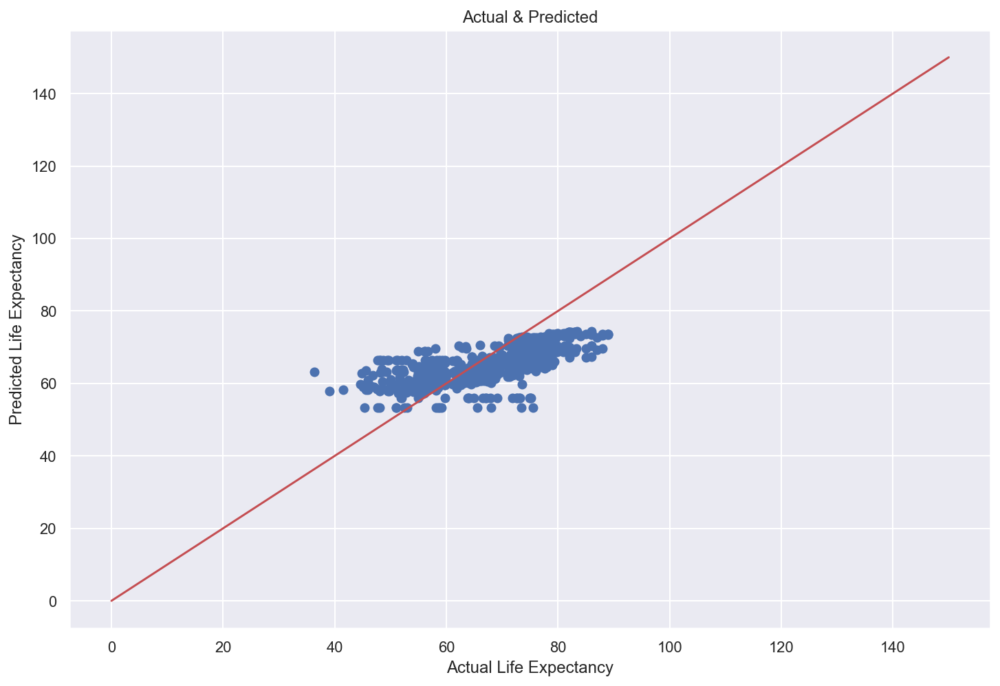

In [69]:
# RobustScaler

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

reg = Lasso()
reg.fit(X_train, y_train)

X_train, X_test, y_train, y_test = train_test_split(X_rs_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))

print("                                     Lasso & RobustScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');

## ElasticNet

In [70]:
# 47. 모델학습
from sklearn.linear_model import LinearRegression

reg = ElasticNet()
reg.fit(X_train, y_train)

ElasticNet()

                                   ElasticNet & StandardScaler
                            MSE of Train Data :  34.600293466012
                            MSE of Test Data :  33.78403973228564
                            RMSE of Train Data :  5.882201413247595
                            RMSE of Test Data :  5.812403954671908


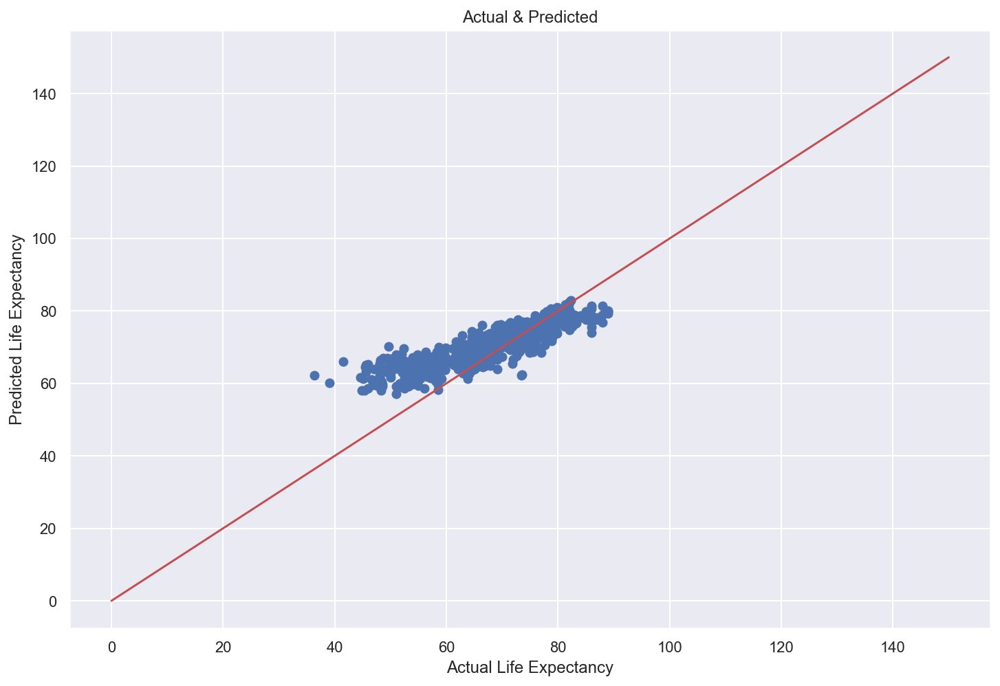

In [71]:
# StandardScaler
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

reg = ElasticNet()
reg.fit(X_train, y_train)


X_train, X_test, y_train, y_test = train_test_split(X_ss_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))

print("                                   ElasticNet & StandardScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');



                                   ElasticNet & MinMaxScaler
                            MSE of Train Data :  76.90826137319966
                            MSE of Test Data :  77.00408444492905
                            RMSE of Train Data :  8.769735536103678
                            RMSE of Test Data :  8.775197117155207


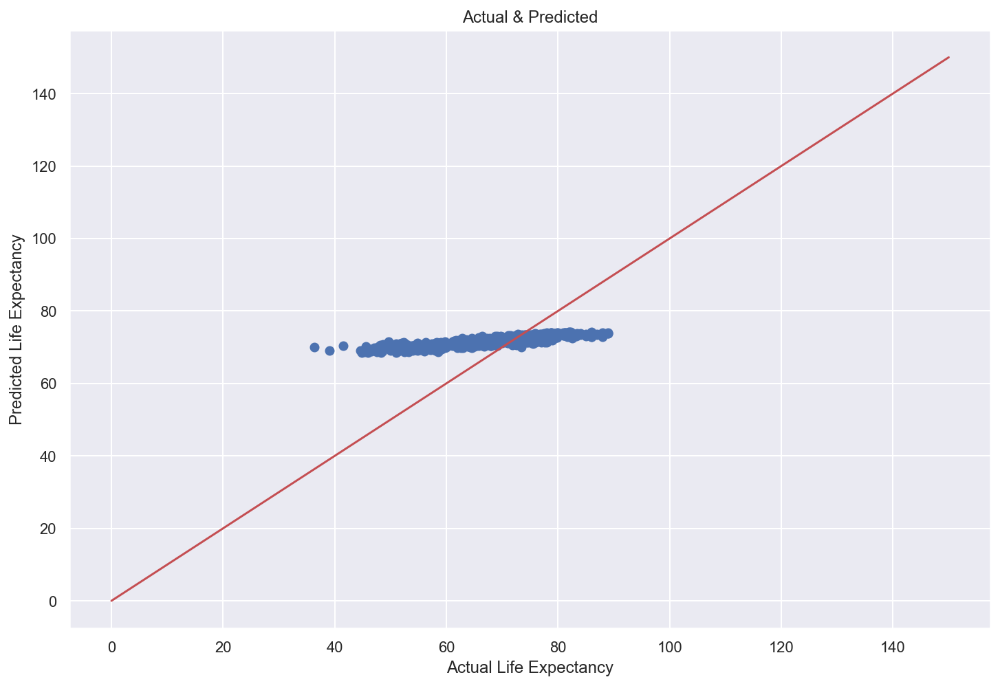

In [72]:
# MinMaxScaler 
from sklearn.linear_model import LinearRegression

reg = ElasticNet()
reg.fit(X_train, y_train)

X_train, X_test, y_train, y_test = train_test_split(X_mm_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))
print("                                   ElasticNet & MinMaxScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');

                                   ElasticNet & RobustScaler
                            MSE of Train Data :  54.19866911767805
                            MSE of Test Data :  52.53511687382365
                            RMSE of Train Data :  7.361974539325578
                            RMSE of Test Data :  7.2481112625168524


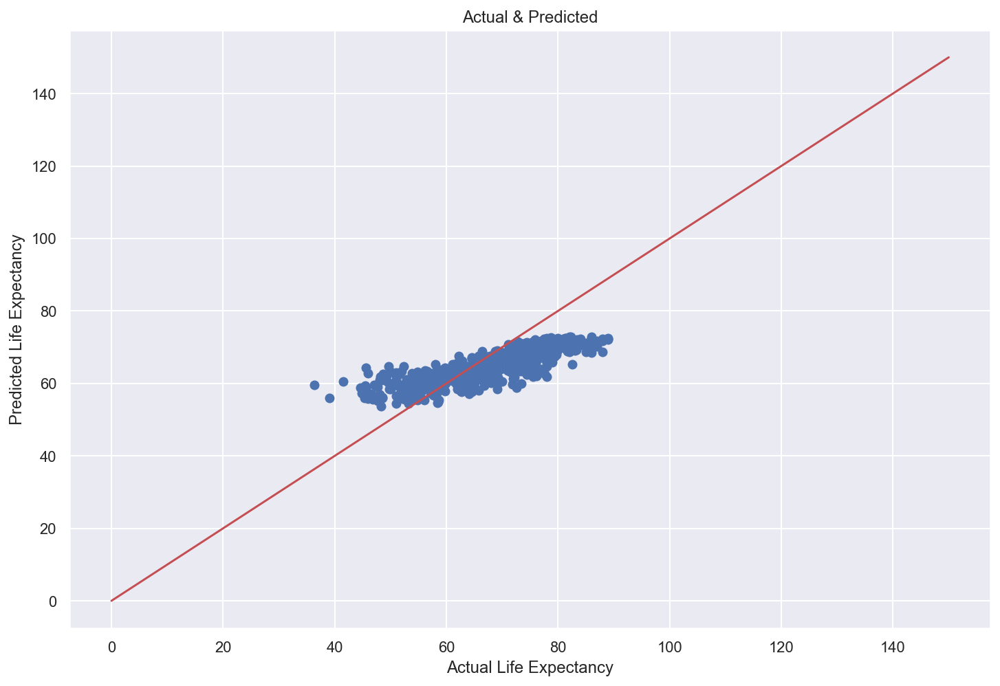

In [73]:
# RobustScaler

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

reg = ElasticNet()
reg.fit(X_train, y_train)

X_train, X_test, y_train, y_test = train_test_split(X_rs_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))

print("                                   ElasticNet & RobustScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');

## RandomForestRegressor

In [74]:
# 47. 모델학습
from sklearn.linear_model import LinearRegression

reg = RandomForestRegressor()
reg.fit(X_train, y_train)

RandomForestRegressor()

                            RandomForestRegressor & StandardScaler
                            MSE of Train Data :  19.618992174610927
                            MSE of Test Data :  19.330265501133812
                            RMSE of Train Data :  4.429333152361756
                            RMSE of Test Data :  4.396619781279001


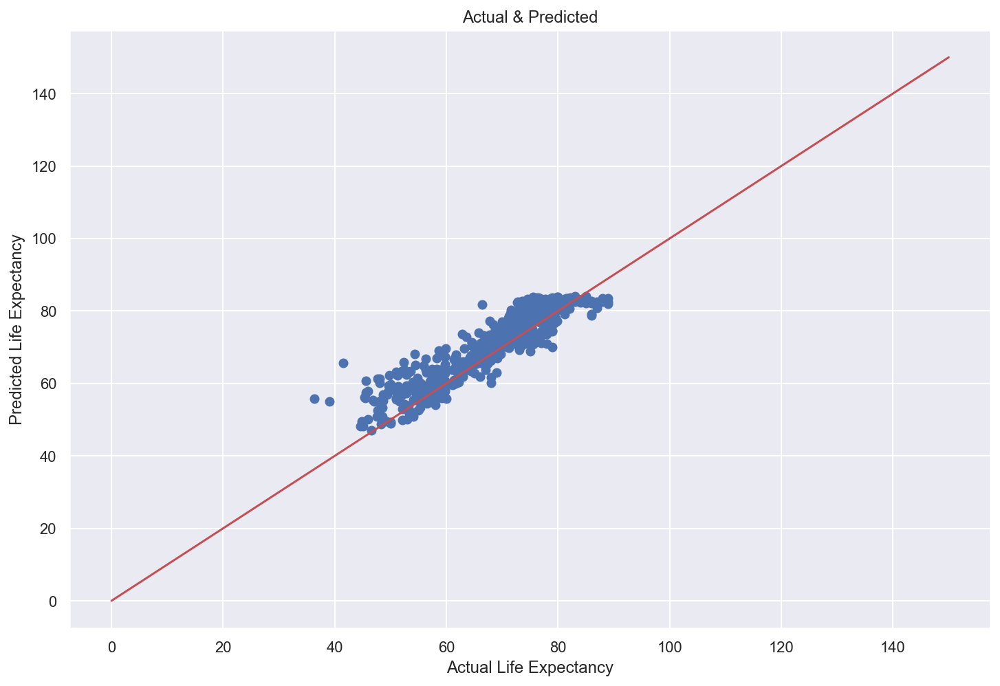

In [75]:
# StandardScaler
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

reg = RandomForestRegressor()
reg.fit(X_train, y_train)


X_train, X_test, y_train, y_test = train_test_split(X_ss_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))

print("                            RandomForestRegressor & StandardScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');



                            RandomForestRegressor & MinMaxScaler
                            MSE of Train Data :  121.66639941001948
                            MSE of Test Data :  121.3776783129252
                            RMSE of Train Data :  11.030249290474783
                            RMSE of Test Data :  11.017153820879747


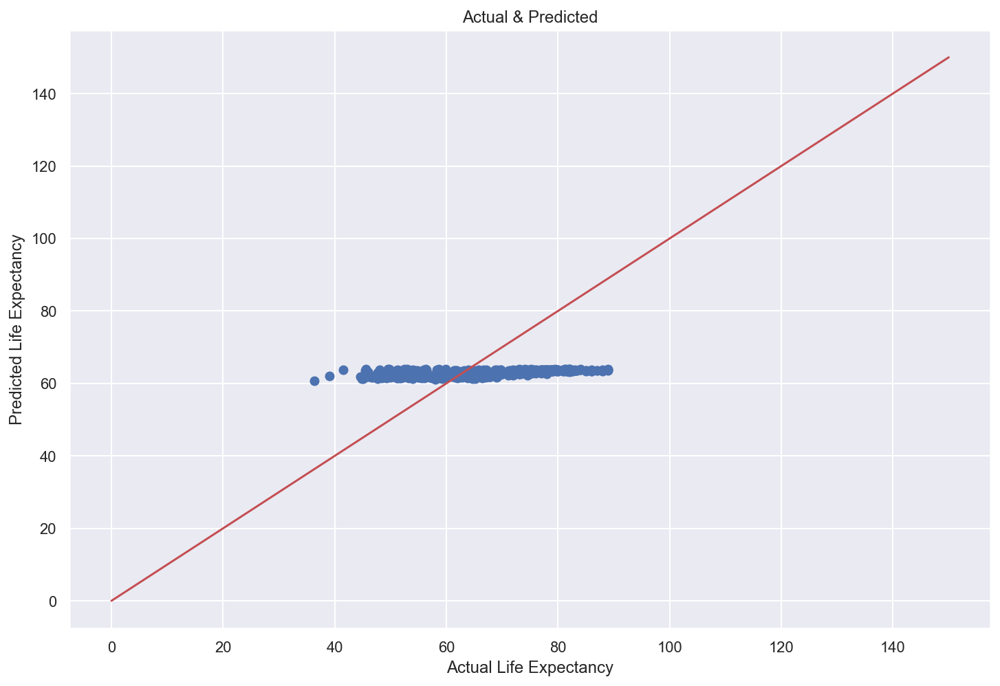

In [76]:
# MinMaxScaler 
from sklearn.linear_model import LinearRegression

reg = RandomForestRegressor()
reg.fit(X_train, y_train)

X_train, X_test, y_train, y_test = train_test_split(X_mm_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))
print("                            RandomForestRegressor & MinMaxScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');

                            RandomForestRegressor & RobustScaler
                            MSE of Train Data :  96.64061264786004
                            MSE of Test Data :  94.57921465532893
                            RMSE of Train Data :  9.830595742266082
                            RMSE of Test Data :  9.725184556363386


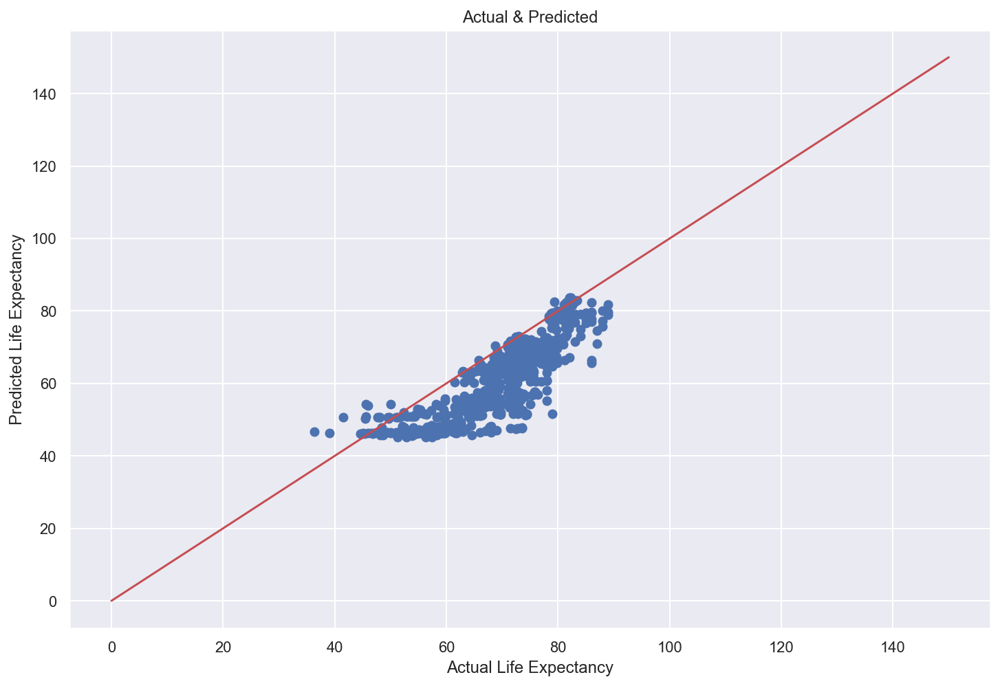

In [77]:
# RobustScaler

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

reg = RandomForestRegressor()
reg.fit(X_train, y_train)

X_train, X_test, y_train, y_test = train_test_split(X_rs_pd, y, 
                                                   test_size = 0.3,
                                                   random_state=13)

pred_tr = reg.predict(X_train)
pred_test = reg.predict(X_test)

mse_tr = mean_squared_error(y_train,pred_tr) 
mse_test = mean_squared_error(y_test,pred_test) 

rmse_tr = (np.sqrt(mean_squared_error(y_train,pred_tr)))
rmse_test = (np.sqrt(mean_squared_error(y_test,pred_test)))

print("                            RandomForestRegressor & RobustScaler")
print('                            MSE of Train Data : ', mse_tr)
print('                            MSE of Test Data : ', mse_test)
print('                            RMSE of Train Data : ', rmse_tr)
print('                            RMSE of Test Data : ', rmse_test)
plt.scatter(y_test, pred_test)
plt.xlabel("Actual Life Expectancy")
plt.ylabel("Predicted Life Expectancy")
plt.title("Actual & Predicted")
plt.plot([0,150],[0,150],'r');

In [78]:
from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train, y_train)

LinearRegression()

In [79]:
import statsmodels.api as sm

model = sm.OLS(y_train, X_train).fit()
print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:         Lifeexpectancy   R-squared (uncentered):                   0.996
Model:                            OLS   Adj. R-squared (uncentered):              0.996
Method:                 Least Squares   F-statistic:                          2.228e+04
Date:                Wed, 12 May 2021   Prob (F-statistic):                        0.00
Time:                        16:52:28   Log-Likelihood:                         -5916.1
No. Observations:                2056   AIC:                                  1.188e+04
Df Residuals:                    2032   BIC:                                  1.202e+04
Df Model:                          24                                                  
Covariance Type:            nonrobust                                                  
                                   coef    std err          t      P>|t|      [0.025      0.975]
-----------------------

In [80]:
# 51. 파이프라인 구축
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

scaler_list = [MinMaxScaler(),StandardScaler(),RobustScaler()]
regr_list = [LinearRegression(), ElasticNet(),Ridge(),RandomForestRegressor(),
             Lasso()]

test_df = []
for regr in regr_list:
    for scaler in scaler_list:
        estimators = [('scaler', scaler),
              ('regr', regr)]
        pipe = Pipeline(estimators)
        pipe.fit(X_train, y_train)
        
        y_pred_tr = pipe.predict(X_train)
        y_pred_test = pipe.predict(X_test)
        
        mse_tr = mean_squared_error(y_train,y_pred_tr) 
        mse_test = mean_squared_error(y_test,y_pred_test) 

        rmse_tr = (np.sqrt(mean_squared_error(y_train,y_pred_tr)))
        rmse_test = (np.sqrt(mean_squared_error(y_test,y_pred_test)))
        
        test_df.append({'scaler':scaler, 'rgr':regr,'MSE_TRAIN':round(mse_tr,2),
                        'MSE_TEST':round(mse_test,2),'RMSE_TRAIN':round(rmse_tr,2),'RMSE_TEST':round(rmse_test,2)})
test_df = pd.DataFrame(test_df)
test_df

,scaler,rgr,MSE_TRAIN,MSE_TEST,RMSE_TRAIN,RMSE_TEST
0,MinMaxScaler(),LinearRegression(),16.05,15.21,4.01,3.90
1,StandardScaler(),LinearRegression(),16.05,15.21,4.01,3.90
2,RobustScaler(),LinearRegression(),16.05,15.21,4.01,3.90
3,MinMaxScaler(),ElasticNet(),67.74,67.50,8.23,8.22
4,StandardScaler(),ElasticNet(),20.52,20.06,4.53,4.48
5,RobustScaler(),ElasticNet(),22.27,21.78,4.72,4.67
6,MinMaxScaler(),Ridge(),16.83,15.92,4.10,3.99
7,StandardScaler(),Ridge(),16.07,15.25,4.01,3.90
8,RobustScaler(),Ridge(),16.05,15.21,4.01,3.90
9,MinMaxScaler(),"(DecisionTreeRegressor(max_features='auto', ra...",0.50,3.49,0.70,1.87


In [81]:
# 52. 교차검증
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor

models = []
models.append(('LinearRegression',LinearRegression()))
models.append(('Ridge',Ridge()))
models.append(('Lasso',Lasso()))
models.append(('ElasticNet',ElasticNet()))
models.append(('RandomForestRegressor',RandomForestRegressor()))

In [83]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
import numpy as np

results=[]
names = []

for name, model in models:
    kfold = KFold(n_splits=5, random_state=13, shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train,
                                cv=kfold, scoring='neg_mean_squared_error')
    results.append(np.sqrt(-cv_results))
    names.append(name)
    
    print(name, cv_results.mean(), cv_results.std())

LinearRegression -16.505588241310456 1.311487538058215
Ridge -16.504424108676368 1.3110125206019834
Lasso -21.73760320259574 1.6744280273814123
ElasticNet -22.56163306363914 1.690827882361942
RandomForestRegressor -3.8587658454420932 0.8407576429290338


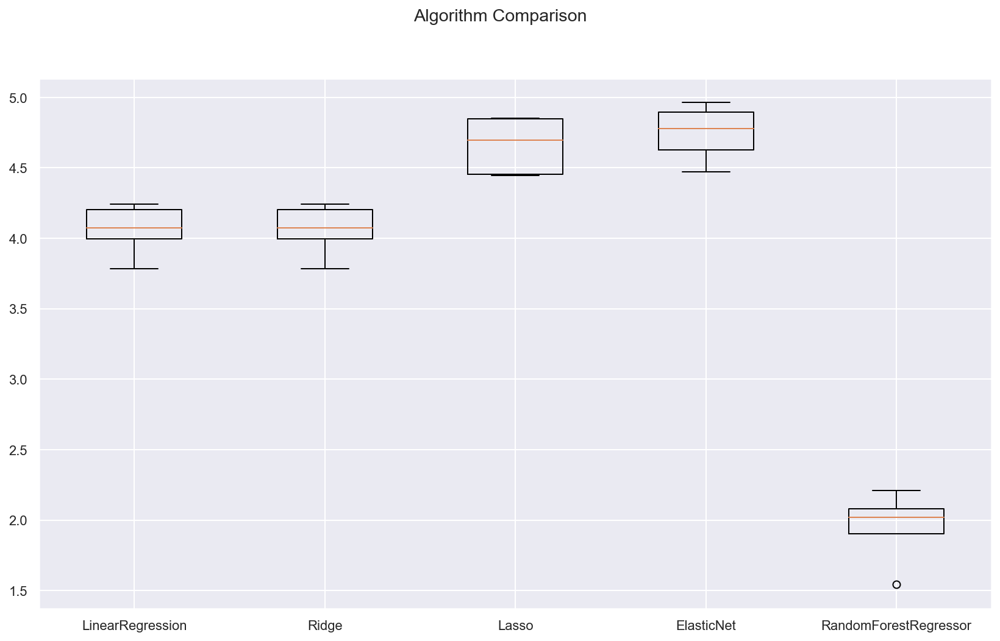

In [84]:
fig = plt.figure(figsize=(14,8))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

In [85]:
# RMSE가 작은 모델이 좋은 모델 : RandomForest
df = pd.DataFrame (results, index = names, columns=[1,2,3,4,5])
df = df.transpose()
df

,LinearRegression,Ridge,Lasso,ElasticNet,RandomForestRegressor
1,3.783056,3.783495,4.453650,4.627977,1.544165
2,4.201316,4.201434,4.852347,4.962751,2.020409
3,4.074588,4.074363,4.696457,4.776485,2.080154
4,4.240805,4.240735,4.847359,4.895684,2.208335
5,3.997334,3.996370,4.444564,4.469739,1.903562


In [86]:
# 53.GridCV
from sklearn.model_selection import train_test_split
import numpy as np

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,
                                                   random_state = 13)
pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', RobustScaler()), ('regr', Lasso())])

In [87]:
from sklearn.model_selection import GridSearchCV

param_grid = [
    {'max_features':[2,4,6,8],
    'n_estimators':[3,10,30]},
    {'max_features':[2,3,4],
    'n_estimators':[3,10]},
]

forest_reg = RandomForestRegressor(random_state=13)
grid_cv = GridSearchCV(forest_reg, param_grid, scoring='neg_mean_squared_error',
                      cv=5, return_train_score=True)
grid_cv.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=13),
             param_grid=[{'max_features': [2, 4, 6, 8],
                          'n_estimators': [3, 10, 30]},
                         {'max_features': [2, 3, 4], 'n_estimators': [3, 10]}],
             return_train_score=True, scoring='neg_mean_squared_error')

In [88]:
grid_cv.best_score_

-4.010519629459024

In [89]:
grid_cv.best_params_

{'max_features': 8, 'n_estimators': 30}

In [90]:
cvres = grid_cv.cv_results_
for mean_score, params in zip(cvres['mean_test_score'], cvres['params']):
    print(np.sqrt(-mean_score),params)

3.0168732856141203 {'max_features': 2, 'n_estimators': 3}
2.6464408346404964 {'max_features': 2, 'n_estimators': 10}
2.4291331016339437 {'max_features': 2, 'n_estimators': 30}
2.762862348879956 {'max_features': 4, 'n_estimators': 3}
2.2946488255213255 {'max_features': 4, 'n_estimators': 10}
2.111247344342261 {'max_features': 4, 'n_estimators': 30}
2.7040048375001784 {'max_features': 6, 'n_estimators': 3}
2.2207584209003275 {'max_features': 6, 'n_estimators': 10}
2.048647916101396 {'max_features': 6, 'n_estimators': 30}
2.586224749423088 {'max_features': 8, 'n_estimators': 3}
2.130732534651294 {'max_features': 8, 'n_estimators': 10}
2.0026281805315294 {'max_features': 8, 'n_estimators': 30}
3.0168732856141203 {'max_features': 2, 'n_estimators': 3}
2.6464408346404964 {'max_features': 2, 'n_estimators': 10}
2.9207406521565327 {'max_features': 3, 'n_estimators': 3}
2.3560949057345684 {'max_features': 3, 'n_estimators': 10}
2.762862348879956 {'max_features': 4, 'n_estimators': 3}
2.29464882

In [91]:
feature_importances = grid_cv.best_estimator_.feature_importances_
feature_importances

array([6.77775427e-03, 6.85711820e-03, 1.73179542e-01, 1.40367122e-02,
       9.30875174e-03, 8.60433763e-03, 2.68760352e-03, 3.64685669e-03,
       1.08471263e-02, 3.46745142e-02, 6.08253759e-03, 5.48337992e-03,
       6.17152873e-03, 2.97602123e-01, 3.56999008e-02, 5.77515104e-03,
       2.65029683e-02, 2.26387750e-02, 2.71482852e-01, 4.98006047e-02,
       2.49526205e-04, 7.17819584e-04, 3.75688628e-04, 7.96828149e-04])